<a href="https://colab.research.google.com/github/rabiul-ai/Arrhythmia_Classification/blob/main/Arrhythmia_Classification_Full_and_Final_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Single-Lead ECG Arrhythmia Classification**


---

By- Md Rabiul Islam 



## **a. Summary, At a Glance**


*   **Task:** Arrhythmia Classification, 5 classes
*   **Dataset:** MIT-BIH ECG dataset, Dataset website: [Here](https://physionet.org/content/mitdb/1.0.0/)
*   **Model:** CNN_LSTM with Attention
*   **Made By:** Md Rabiul Islam, PhD Student, Texas A&M University. [Personal Website](https://sites.google.com/view/rabiuleeekuet/home). [Google Scholar](https://scholar.google.com/citations?user=GfveUqIAAAAJ&hl=en). Email: rabiul.kuet.bd@gmail.com. 
*   **Supervised By:** Prof. Dr. Erchin Serpedin. (Collaboration: Prof. Dr. Khalid Qaraqe, Assoc. Prof. Dr. Marwa Qaraqe)
*   **Date:** November 2022 - January 2023

## **b. Information about Dataset:**


The dataset can be downloaded from the original [website](https://physionet.org/content/mitdb/1.0.0/) or by clicking the [link](https://physionet.org/static/published-projects/mitdb/mit-bih-arrhythmia-database-1.0.0.zip) directly. The overall information about the dataset is given [here](https://archive.physionet.org/physiobank/database/html/mitdbdir/intro.htm).
1. The MIT-BIH dataset contains **48 readings**.
2. Number of **patients = 47** (25 Men, 22 Women). Only 1 patient has 2 readings. Rest 1 readings/patients.
3. Each reading contains a. ECG signals b. Annotations
4. ECG signals length = **30 Minutes** (or slightly over). Sampling Frequency = **360 Hz**. 
5. Each reading contains **2 Lead ECG** signals that are Modified Limb Lead II and Modified Lead V1 (Occationally V2, V5, V4 just only once). Simply, Two Leads: **MLII, V1**.
6. Annotation is given for each beat. Although 20 types of beats are annotated in dataset. We consider only **15 types** of beats grouped in **5 classes** followed by the recommendation of **AAMI**.
* N - Normal
* S - Supraventricular premature beat
* V - Premature ventricular contraction
* F - Fusion of ventricular and normal beat
* Q - Unclassifiable / Unknown beat 

### **Additional Dataset Information:**
The source of the ECGs included in the MIT-BIH Arrhythmia Database is a set of over **4000 long-term Holter recordings** that were obtained by the **Beth Israel Hospital** Arrhythmia Laboratory between **1975 and 1979**. Approximately **60%** of these recordings were obtained from **inpatients**. The subjects were 25 men aged 32 to 89 years, and 22 women aged 23 to 89 years

# **Main Parts of the Study:** 

1.   **Part A: Installing Packages and Basic Visualization of ECG**
2.   **Part B: Denoising, R-Peak Detection, Segmentation**
3.   **Part C: Dataset Loading**
4.   **Part D: Train-Test Splitting and Class Balancing**
5.   **Part E: Model Building and Training**
6.   **Part F: Results**

# **Part A: Installing Packages and Basic Visualization of ECG**

## **A1: Installing Packages**

In [1]:
# wfdb is not normally installed in Colab

!pip install wfdb
!pip install PyWavelets
!pip install imbalanced-learn



[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# Importing packages
import os
import datetime
import wfdb
import pywt
import seaborn
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from os.path import join as osj
import pandas as pd

In [3]:
DATA_ROOT_MITDB = "./mitdb"  # folder where database is stored
RECORDS_MITDB = os.path.join(DATA_ROOT_MITDB, "RECORDS.csv")  # contains patient IDs
osj_mitdb = os.path.join

DATA_ROOT_INCART = "./incart"  # folder where database is stored
RECORDS_INCART = os.path.join(DATA_ROOT_INCART, "RECORDS.csv")  # contains patient IDs
osj_incart = os.path.join

## **A2: Basic Visualization of ECG**
Basic code for loading (reading), plotting and playing with ECG signals

### **a. Getting Recordings' IDs**
The ECG recordings are named after Patients' IDs (from 100 to 234), sorted but not consecutive. Total 48 recordings. 

### **b. 1 Patient ECG loading and plotting**
Extracting 2 leads ECG signals of a patient (for example: 100), and saving in two lists. 

In [4]:
patient_ids_mitdb = pd.read_csv(RECORDS_MITDB, header=None)[0].to_numpy()
patient_ids_mitdb


array([100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 111, 112, 113,
       114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 200, 201, 202,
       203, 205, 207, 208, 209, 210, 212, 213, 214, 215, 217, 219, 220,
       221, 222, 223, 228, 230, 231, 232, 233, 234])

In [5]:
patient_ids_incart = pd.read_csv(RECORDS_INCART, header=None)[0].to_numpy()
patient_ids_incart

array(['I01', 'I02', 'I03', 'I04', 'I05', 'I06', 'I07', 'I08', 'I09',
       'I10', 'I11', 'I12', 'I13', 'I14', 'I15', 'I16', 'I17', 'I18',
       'I19', 'I20', 'I21', 'I22', 'I23', 'I24', 'I25', 'I26', 'I27',
       'I28', 'I29', 'I30', 'I31', 'I32', 'I33', 'I34', 'I35', 'I36',
       'I37', 'I38', 'I39', 'I40', 'I41', 'I42', 'I43', 'I44', 'I45',
       'I46', 'I47', 'I48', 'I49', 'I50', 'I51', 'I52', 'I53', 'I54',
       'I55', 'I56', 'I57', 'I58', 'I59', 'I60', 'I61', 'I62', 'I63',
       'I64', 'I65', 'I66', 'I67', 'I68', 'I69', 'I70', 'I71', 'I72',
       'I73', 'I74', 'I75'], dtype=object)

In [6]:
#Extracting just 1 patient ECG signal and info

lead0_mit = {}  # without this it shows lead0[100] is not defined
lead1_mit = {}
patient_id_mit = 100
signals_mit, info_mit = wfdb.io.rdsamp(osj_mitdb(DATA_ROOT_MITDB, str(100)))
lead0_mit[100] = signals_mit[:, 0]
lead1_mit[100] = signals_mit[:, 1]

<class 'numpy.ndarray'>
(650000,)
{'fs': 360, 'sig_len': 650000, 'n_sig': 2, 'base_date': None, 'base_time': None, 'units': ['mV', 'mV'], 'sig_name': ['MLII', 'V5'], 'comments': ['69 M 1085 1629 x1', 'Aldomet, Inderal']}


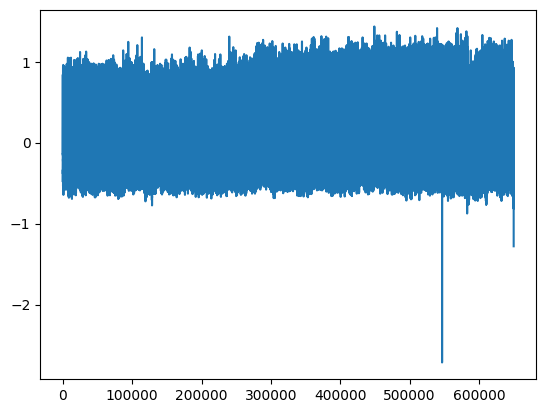

In [7]:
# Visualization of 1 patients signal and info
print(type(lead0_mit[100]))
print(lead0_mit[100].shape)
plt.plot(lead0_mit[100])
print(info_mit)

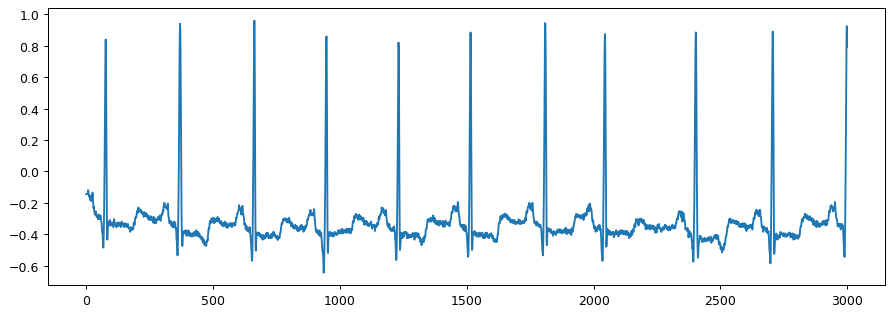

In [8]:
# ECG signal per second
a = lead0_mit[100][0: 3000]
plt.figure(figsize=(12, 4), dpi=90)
plt.plot(a)

In [9]:
lead0_incart = {}  # without this it shows lead0[100] is not defined
lead1_incart = {}
patient_id_incart = 'I01'
signals_incart, info_incart = wfdb.io.rdsamp(osj_incart(DATA_ROOT_INCART, str("I01")))
lead0_incart['I01'] = signals_incart[:, 0]
lead1_incart['I01'] = signals_incart[:, 1]

<class 'numpy.ndarray'>
(462600,)
{'fs': 257, 'sig_len': 462600, 'n_sig': 12, 'base_date': None, 'base_time': None, 'units': ['mV', 'mV', 'mV', 'mV', 'mV', 'mV', 'mV', 'mV', 'mV', 'mV', 'mV', 'mV'], 'sig_name': ['I', 'II', 'III', 'AVR', 'AVL', 'AVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6'], 'comments': ['<age>: 65 <sex>: F <diagnoses> Coronary artery disease, arterial hypertension', 'patient 1', 'PVCs, noise']}


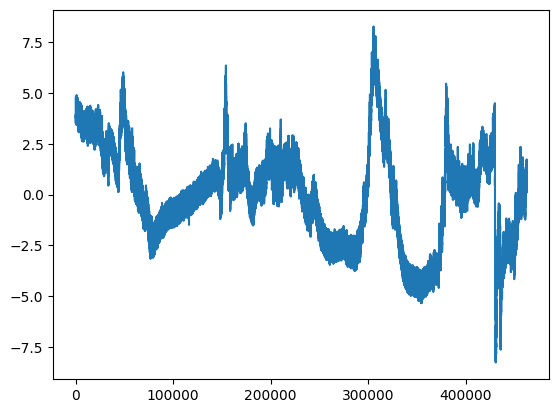

In [10]:
# Visualization of 1 patients signal and info
print(type(lead0_incart['I01']))
print(lead0_incart['I01'].shape)
plt.plot(lead0_incart['I01'])
print(info_incart)

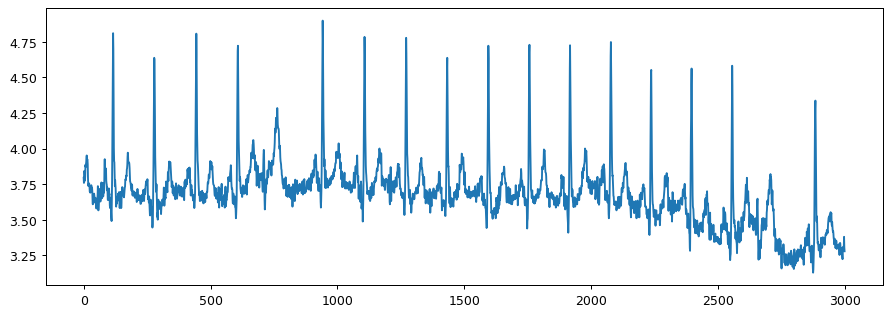

In [11]:
# ECG signal per second
a = lead0_incart["I01"][0: 3000]
plt.figure(figsize=(12, 4), dpi=90)
plt.plot(a)

### **c. All patients' ECG loading**

In [12]:
# Loading all patients ECG SIGNALs using for loop
def get_ecg_signals(patient_ids,root):
    lead0 = {}
    lead1 = {}
    for id_ in patient_ids:
        signals, info = wfdb.io.rdsamp(osj_mitdb(root, str(id_)))
        lead0[id_] = signals[:, 0]
        lead1[id_] = signals[:, 1]
        print(f'Signal of patient {id_} extracted')
    return lead0, lead1

In [13]:
# Loading all patient ECG INFORMATION 
def get_ecg_info(patient_ids,root):
    _, info = wfdb.io.rdsamp(osj_mitdb(root, str(patient_ids)))
    resolution = 2**11  # Number of possible signal values we can have.
    info["resolution"] = 2**11
    return info

In [14]:
def get_12_leads_signals(patient_ids, root):
    leads_data = {}

    for id_ in patient_ids:
        # Read the ECG signals for the patient
        signals, info = wfdb.io.rdsamp(osj_mitdb(root, str(id_)))
        
        # Store the signals for all 12 leads in a dictionary
        leads_data[id_] = signals  # signals is a 2D array with shape (num_samples, num_leads)
        
        print(f'Signals of patient {id_} extracted with {signals.shape[1]} leads.')

    return leads_data

Signals of patient I01 extracted with 12 leads.
Signals of patient I02 extracted with 12 leads.
Signals of patient I03 extracted with 12 leads.
Signals of patient I04 extracted with 12 leads.
Signals of patient I05 extracted with 12 leads.
Signals of patient I06 extracted with 12 leads.
Signals of patient I07 extracted with 12 leads.
Signals of patient I08 extracted with 12 leads.
Signals of patient I09 extracted with 12 leads.
Signals of patient I10 extracted with 12 leads.
Signals of patient I11 extracted with 12 leads.
Signals of patient I12 extracted with 12 leads.
Signals of patient I13 extracted with 12 leads.
Signals of patient I14 extracted with 12 leads.
Signals of patient I15 extracted with 12 leads.
Signals of patient I16 extracted with 12 leads.
Signals of patient I17 extracted with 12 leads.
Signals of patient I18 extracted with 12 leads.
Signals of patient I19 extracted with 12 leads.
Signals of patient I20 extracted with 12 leads.
Signals of patient I21 extracted with 12

Text(0, 0.5, 'Amplitude (mV)')

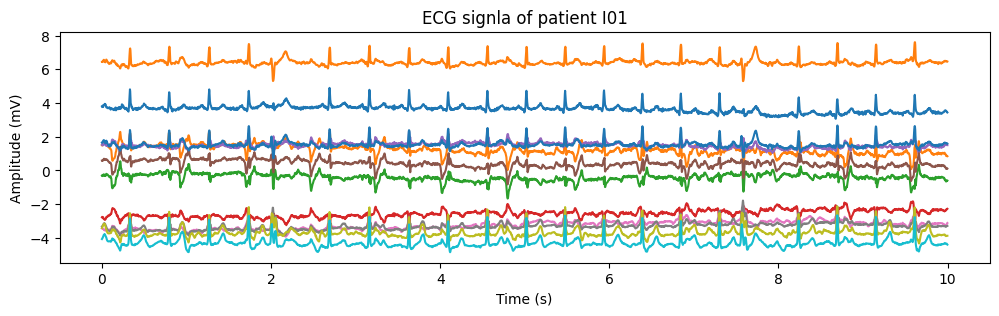

In [15]:
leads_data = get_12_leads_signals(patient_ids_incart,DATA_ROOT_INCART)

# Plot any patient signal from any time frame
patient_id = "I01" # can change
starting_time = 0 # can change
ending_time = 10 # can change

# Scaling
starting_signal_point = starting_time*350
ending_signal_point = ending_time*350 # As sampling frequency is 350 Hz
x = np.arange(starting_time, ending_time, 1/350)
signal = leads_data[patient_id][starting_signal_point: ending_signal_point]

plt.figure(figsize=(12, 3), dpi=100)
plt.plot(x, signal)
plt.title(f'ECG signla of patient {patient_id}')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (mV)')




In [16]:
lead0_mit, lead1_mit = get_ecg_signals(patient_ids_mitdb,DATA_ROOT_MITDB)

Signal of patient 100 extracted
Signal of patient 101 extracted
Signal of patient 102 extracted
Signal of patient 103 extracted
Signal of patient 104 extracted
Signal of patient 105 extracted
Signal of patient 106 extracted
Signal of patient 107 extracted
Signal of patient 108 extracted
Signal of patient 109 extracted
Signal of patient 111 extracted
Signal of patient 112 extracted
Signal of patient 113 extracted
Signal of patient 114 extracted
Signal of patient 115 extracted
Signal of patient 116 extracted
Signal of patient 117 extracted
Signal of patient 118 extracted
Signal of patient 119 extracted
Signal of patient 121 extracted
Signal of patient 122 extracted
Signal of patient 123 extracted
Signal of patient 124 extracted
Signal of patient 200 extracted
Signal of patient 201 extracted
Signal of patient 202 extracted
Signal of patient 203 extracted
Signal of patient 205 extracted
Signal of patient 207 extracted
Signal of patient 208 extracted
Signal of patient 209 extracted
Signal o

Text(0, 0.5, 'Amplitude (mV)')

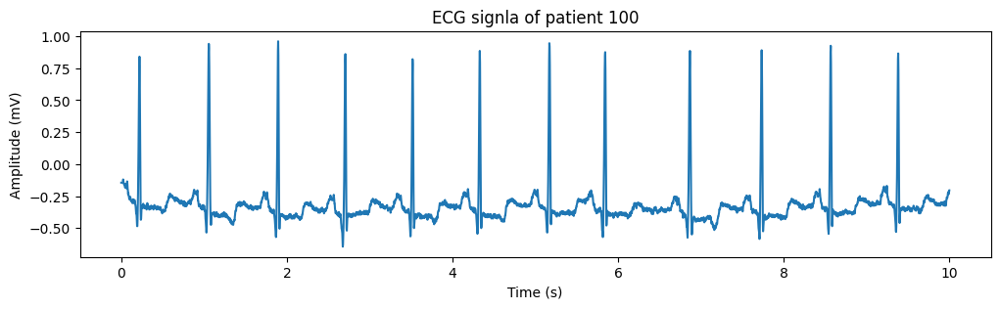

In [17]:
# Plot any patient signal from any time frame
patient_id = 100 # can change
starting_time = 0 # can change
ending_time = 10 # can change

# Scaling
starting_signal_point = starting_time*350
ending_signal_point = ending_time*350 # As sampling frequency is 350 Hz
x = np.arange(starting_time, ending_time, 1/350)
signal = lead0_mit[patient_id][starting_signal_point: ending_signal_point]

plt.figure(figsize=(12, 3), dpi=100)
plt.plot(x, signal)
plt.title(f'ECG signla of patient {patient_id}')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (mV)')

In [18]:
# ECG info of any patient
ecg_info = get_ecg_info(patient_ids_mitdb[0],DATA_ROOT_MITDB)
ecg_info

{'fs': 360,
 'sig_len': 650000,
 'n_sig': 2,
 'base_date': None,
 'base_time': None,
 'units': ['mV', 'mV'],
 'sig_name': ['MLII', 'V5'],
 'comments': ['69 M 1085 1629 x1', 'Aldomet, Inderal'],
 'resolution': 2048}

In [19]:

lead0_incart, lead1_incart = get_ecg_signals(patient_ids_incart,DATA_ROOT_INCART)


Signal of patient I01 extracted
Signal of patient I02 extracted
Signal of patient I03 extracted
Signal of patient I04 extracted
Signal of patient I05 extracted
Signal of patient I06 extracted
Signal of patient I07 extracted
Signal of patient I08 extracted
Signal of patient I09 extracted
Signal of patient I10 extracted
Signal of patient I11 extracted
Signal of patient I12 extracted
Signal of patient I13 extracted
Signal of patient I14 extracted
Signal of patient I15 extracted
Signal of patient I16 extracted
Signal of patient I17 extracted
Signal of patient I18 extracted
Signal of patient I19 extracted
Signal of patient I20 extracted
Signal of patient I21 extracted
Signal of patient I22 extracted
Signal of patient I23 extracted
Signal of patient I24 extracted
Signal of patient I25 extracted
Signal of patient I26 extracted
Signal of patient I27 extracted
Signal of patient I28 extracted
Signal of patient I29 extracted
Signal of patient I30 extracted
Signal of patient I31 extracted
Signal o

In [20]:
from scipy.signal import resample_poly

def resample_signals(signals_dict, orig_fs=257, target_fs=360):
    """Resample ECG signals in a dictionary {id: signal}."""
    resampled = {}
    for pid, sig in signals_dict.items():
        resampled[pid] = resample_poly(sig, target_fs, orig_fs)
    return resampled

In [21]:
# Apply to your INCART leads
lead0_incart_resampled = resample_signals(lead0_incart, 257, 360)
lead1_incart_resampled = resample_signals(lead1_incart, 257, 360)

Text(0, 0.5, 'Amplitude (mV)')

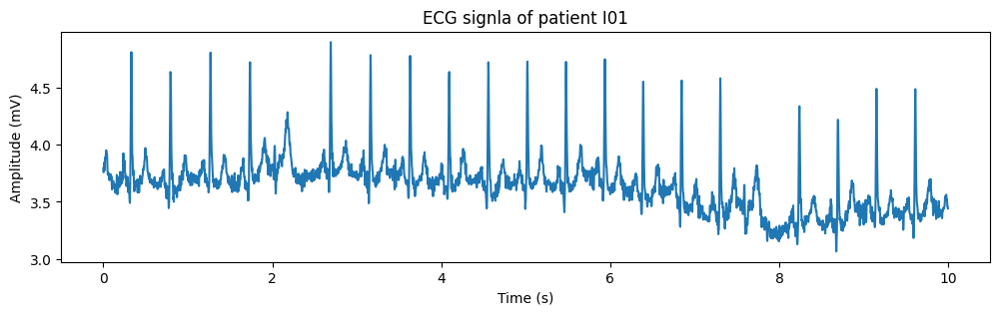

In [22]:
# Plot any patient signal from any time frame
patient_id = "I01" # can change
starting_time = 0 # can change
ending_time = 10 # can change

# Scaling
starting_signal_point = starting_time*350
ending_signal_point = ending_time*350 # As sampling frequency is 350 Hz
x = np.arange(starting_time, ending_time, 1/350)
signal = lead0_incart[patient_id][starting_signal_point: ending_signal_point]

plt.figure(figsize=(12, 3), dpi=100)
plt.plot(x, signal)
plt.title(f'ECG signla of patient {patient_id}')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (mV)')

Text(0, 0.5, 'Amplitude (mV)')

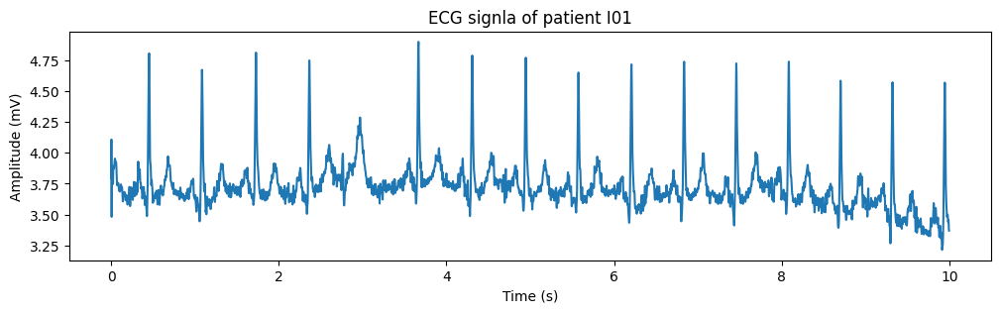

In [23]:
# Plot any patient signal from any time frame
patient_id = "I01" # can change
starting_time = 0 # can change
ending_time = 10 # can change

# Scaling
starting_signal_point = starting_time*360
ending_signal_point = ending_time*360 # As sampling frequency is 350 Hz
x = np.arange(starting_time, ending_time, 1/360)
signal = lead0_incart_resampled[patient_id][starting_signal_point: ending_signal_point]

plt.figure(figsize=(12, 3), dpi=100)
plt.plot(x, signal)
plt.title(f'ECG signla of patient {patient_id}')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (mV)')

In [24]:
# ECG info of any patient
ecg_info = get_ecg_info(patient_ids_incart[0],DATA_ROOT_INCART)
ecg_info

{'fs': 257,
 'sig_len': 462600,
 'n_sig': 12,
 'base_date': None,
 'base_time': None,
 'units': ['mV',
  'mV',
  'mV',
  'mV',
  'mV',
  'mV',
  'mV',
  'mV',
  'mV',
  'mV',
  'mV',
  'mV'],
 'sig_name': ['I',
  'II',
  'III',
  'AVR',
  'AVL',
  'AVF',
  'V1',
  'V2',
  'V3',
  'V4',
  'V5',
  'V6'],
 'comments': ['<age>: 65 <sex>: F <diagnoses> Coronary artery disease, arterial hypertension',
  'patient 1',
  'PVCs, noise'],
 'resolution': 2048}

# **Part B: Denoising, R-Peak Detection, Segmentation** 

### **B1: Denoising**
Noise removing by using Discrete Wavelet Transform (DCT)

In [26]:
# User defined fucntion for DWT and reconstruction
def denoise(data):
    # wavelet transform
    coeffs = pywt.wavedec(data=data, wavelet='db5', level=9)
    cA9, cD9, cD8, cD7, cD6, cD5, cD4, cD3, cD2, cD1 = coeffs

    # Threshold denoising
    threshold = (np.median(np.abs(cD1)) / 0.6745) * (np.sqrt(2 * np.log(len(cD1))))
    cD1.fill(0)
    cD2.fill(0)
    for i in range(1, len(coeffs) - 2):
        coeffs[i] = pywt.threshold(coeffs[i], threshold)

    # Inverse wavelet transform to obtain the denoised signal
    rdata = pywt.waverec(coeffs=coeffs, wavelet='db5')
    return rdata

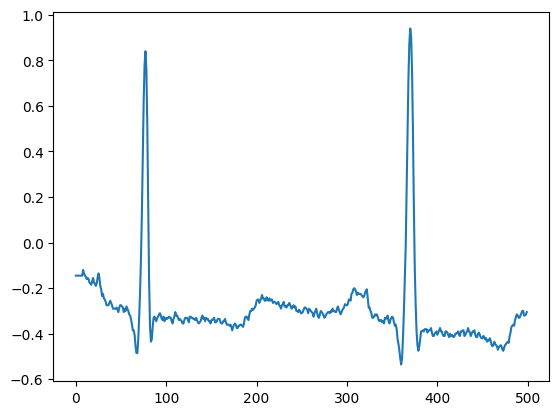

In [27]:
# Ploting a signal before denoising
project_path_MIT = DATA_ROOT_MITDB + "/"   # make sure it ends with /


record_mit = wfdb.rdrecord(project_path_MIT + '100', channel_names=['MLII'])
data_mit = record_mit.p_signal.flatten()
plt.plot(data_mit[0:500])

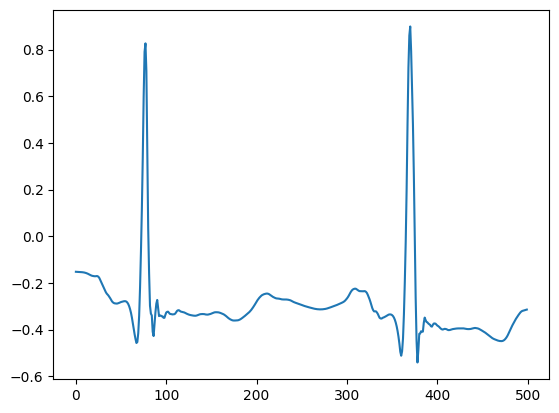

In [28]:
# Same signal after denoising
rdata_mit = denoise(data=data_mit)
plt.plot(rdata_mit[0:500])

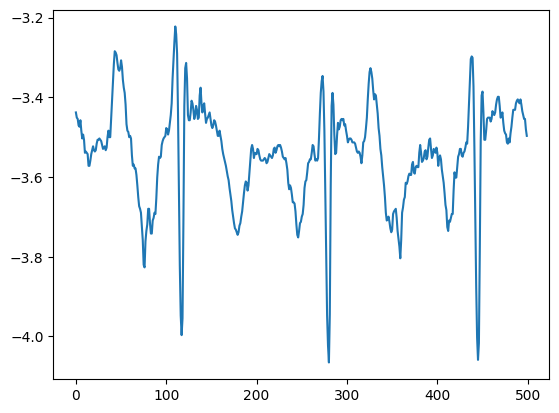

In [29]:
# Ploting a signal before denoising
project_path_incart = DATA_ROOT_INCART + "/"   # make sure it ends with /


record_incart = wfdb.rdrecord(project_path_incart + 'I01', channel_names=['V1'])
data_incart = record_incart.p_signal.flatten()
plt.plot(data_incart[0:500])

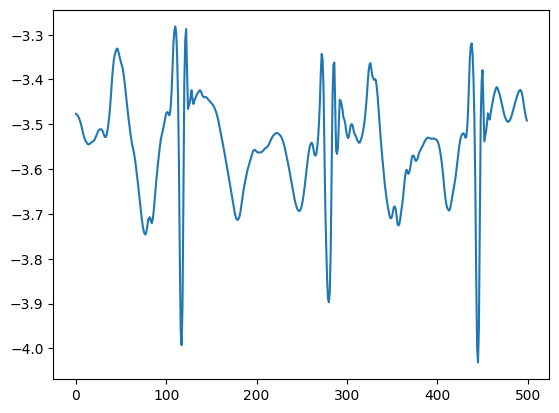

In [30]:
rdata_incart = denoise(data=data_incart)
plt.plot(rdata_incart[0:500])

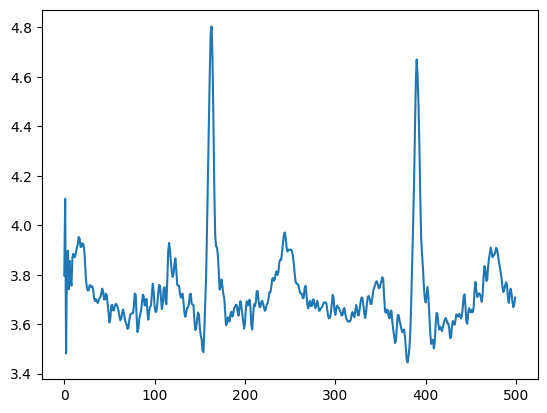

In [31]:
# Ploting a signal before denoising
project_path_incart = DATA_ROOT_INCART + "/"   # make sure it ends with /


record_incart_resampled = lead0_incart_resampled["I01"]
data_incart_resampled = record_incart_resampled.flatten()
plt.plot(data_incart_resampled[0:500])

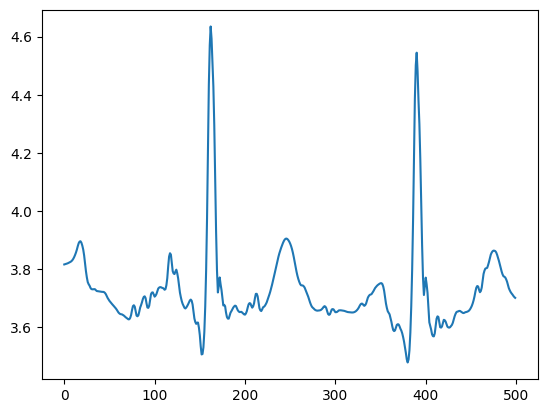

In [32]:
rdata_incart_resampled = denoise(data=data_incart_resampled)
plt.plot(rdata_incart_resampled[0:500])

### **B2: R-Peak Detection**
R-peak is annotated in MIT-BIH dataset. Just need to read the file.

In [33]:
# For exmaple, we extract '100' recording annotation
annotation_mit = wfdb.rdann(project_path_MIT + '100', 'atr')
Rlocation_mit = annotation_mit.sample
print(Rlocation_mit)
Rclass_mit = annotation_mit.symbol
print(Rclass_mit)

[    18     77    370 ... 649484 649734 649991]
['+', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'A', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', '

In [34]:
len(annotation_mit.symbol)

2274

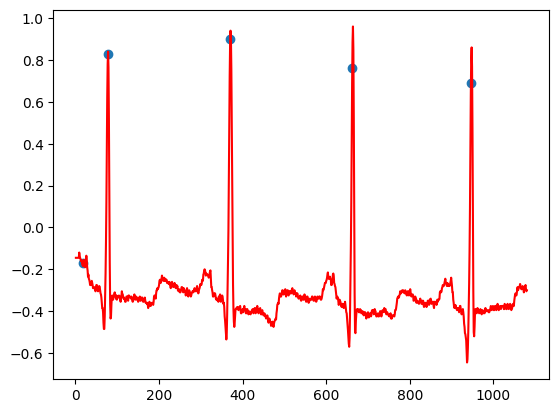

In [35]:
# R-peak ploting
x = np.arange(1, 1081)

n_peak =5
r_peak_x = []
r_peak_y = []
for i in range(0, n_peak):
  r_peak_x.append(Rlocation_mit[i])
  r_peak_y.append(rdata_mit[Rlocation_mit[i]])

plt.plot(x, data_mit[0:1080], color='red')
plt.scatter(r_peak_x, r_peak_y)

In [36]:
# For exmaple, we extract '100' recording annotation
annotation_incart = wfdb.rdann(project_path_incart + 'I01', 'atr')
Rlocation_incart = annotation_incart.sample
print(Rlocation_incart)
Rclass_incart = annotation_incart.symbol
print(Rclass_incart)

[   114    277    442 ... 462068 462243 462416]
['N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'V', 'N', 'V', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'V', 'N', 'V', 'N', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'V', 'N', 'V', 'N', 'N', 'N', 'V', 'N', 'N', 'N', 'N', 'N', 'N', '

In [37]:
len(annotation_incart.symbol)

2757

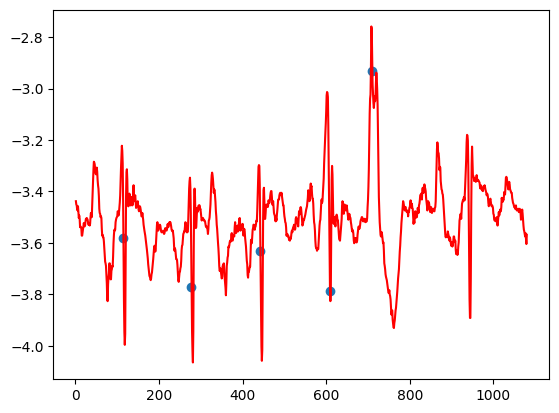

In [38]:
# R-peak ploting
x = np.arange(1, 1081)

n_peak =5
r_peak_x = []
r_peak_y = []
for i in range(0, n_peak):
  r_peak_x.append(Rlocation_incart[i])
  r_peak_y.append(rdata_incart[Rlocation_incart[i]])

plt.plot(x, data_incart[0:1080], color='red')
plt.scatter(r_peak_x, r_peak_y)

In [39]:
annotation_incart_resampled = wfdb.rdann(project_path_incart + 'I01', 'atr')
Rlocation_incart_sampled = annotation_incart_resampled.sample   # original indices
Rclass_incart_resampled = annotation_incart_resampled.symbol      # beat labels

print(Rlocation_incart)
# Rescale to match resampled signal (360 Hz)
Rlocation_incart_resampled = np.round(
    Rlocation_incart_sampled * 360 / 257
).astype(int)
print(Rlocation_incart_resampled)

[   114    277    442 ... 462068 462243 462416]
[   160    388    619 ... 647255 647500 647742]


In [41]:
len(annotation_incart_resampled.symbol)

2757

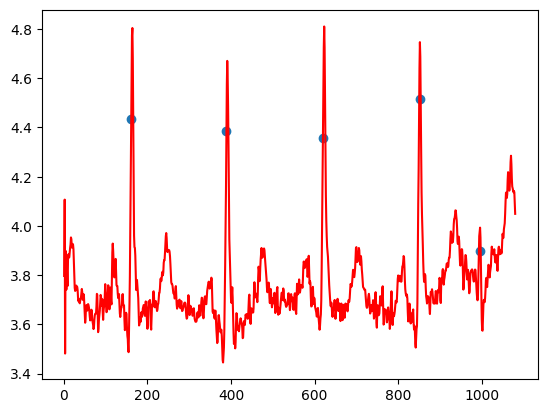

In [42]:
# R-peak ploting
x = np.arange(1, 1081)

n_peak =5
r_peak_x = []
r_peak_y = []
for i in range(0, n_peak):
  r_peak_x.append(Rlocation_incart_resampled[i])
  r_peak_y.append(rdata_incart_resampled[Rlocation_incart_resampled[i]])

plt.plot(x, data_incart_resampled[0:1080], color='red')
plt.scatter(r_peak_x, r_peak_y)

### **B3: Segmentation**
Each ECG signal is segmented by using a window **length of 300**. From R-peak location, **99** samples taken from **left** and **201** samples from **right**. Thus a complete **heartbeat** is found.

(300,)
(300,)
(300,)


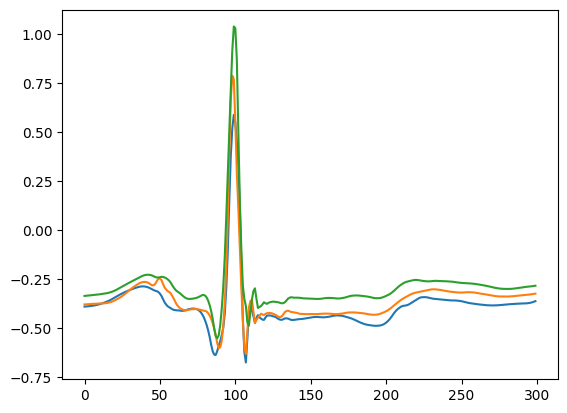

In [43]:
# Plotting 3 heartbeats
k = np.arange(100, 103)
for i in k:
  # print(i)
  # print(Rlocation[i] - 99, Rlocation[i] + 201)
  x_train_mit = rdata_mit[Rlocation_mit[i] - 99:Rlocation_mit[i] + 201]
  plt.plot(x_train_mit)
  print(x_train_mit.shape)
plt.show()

(300,)
(300,)
(300,)


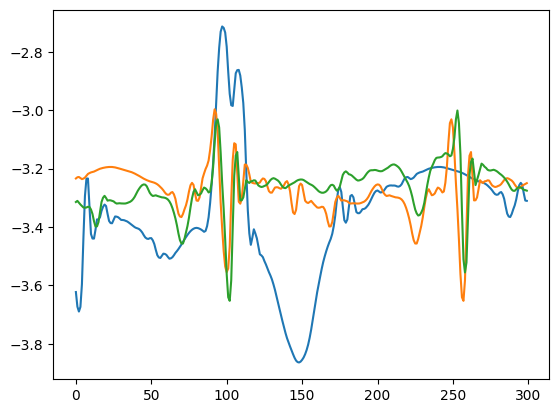

In [44]:
# Plotting 3 heartbeats
k = np.arange(100, 103)
for i in k:
  # print(i)
  # print(Rlocation[i] - 99, Rlocation[i] + 201)
  x_train_incart = rdata_incart[Rlocation_incart[i] - 99:Rlocation_incart[i] + 201]
  plt.plot(x_train_incart)
  print(x_train_incart.shape)
plt.show()

(300,)
(300,)
(300,)


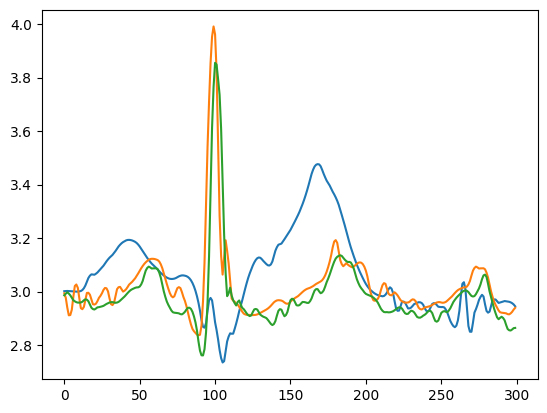

In [45]:
# Plotting 3 heartbeats
k = np.arange(100, 103)
for i in k:
  # print(i)
  # print(Rlocation[i] - 99, Rlocation[i] + 201)
  x_train_incart_resampled = rdata_incart_resampled[Rlocation_incart_resampled[i] - 99:Rlocation_incart_resampled[i] + 201]
  plt.plot(x_train_incart_resampled)
  print(x_train_incart_resampled.shape)
plt.show()

### **B4: Complete Preprocessing Figures**
The complete preprocessing including denosinsing, R-peak location detection and segmentation is expected to view in a single figure. 

In [46]:
r_peak_xx_mit = Rlocation_mit[0], Rlocation_mit[1], Rlocation_mit[2], Rlocation_mit[3]
r_peak_yy_mit = rdata_mit[Rlocation_mit[0]], rdata_mit[Rlocation_mit[1]], rdata_mit[Rlocation_mit[2]], rdata_mit[Rlocation_mit[3]]

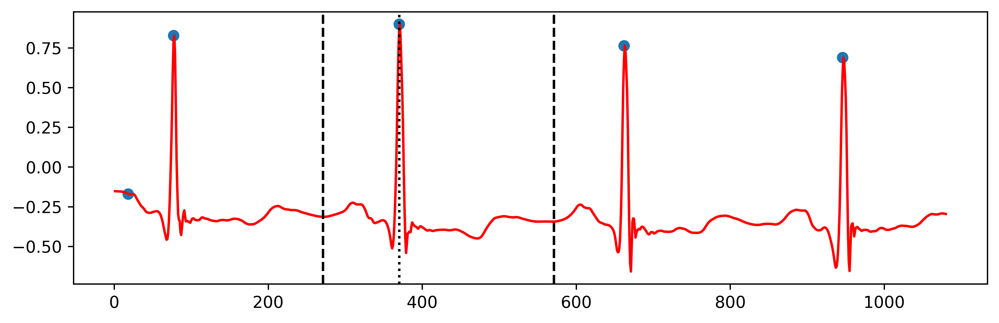

In [47]:
# Plotting R-peaks and segmentation lines
fig = plt.figure(figsize=(10,3), dpi=600)
n_peak =5
r_peak_x = []
r_peak_y = []
for i in range(0, n_peak):
  r_peak_x.append(Rlocation_mit[i])
  r_peak_y.append(rdata_mit[Rlocation_mit[i]])
x = np.arange(1, 1081)
plt.plot(x, rdata_mit[0: 1080], color='red')
plt.scatter(r_peak_x, r_peak_y)

# line plotting
plt.axvline(x = Rlocation_mit[2], color = 'k', linestyle = ':') 
plt.axvline(x = Rlocation_mit[2]-99, color = 'k', linestyle = '--') 
plt.axvline(x = Rlocation_mit[2]+201, color = 'k', linestyle = '--') 

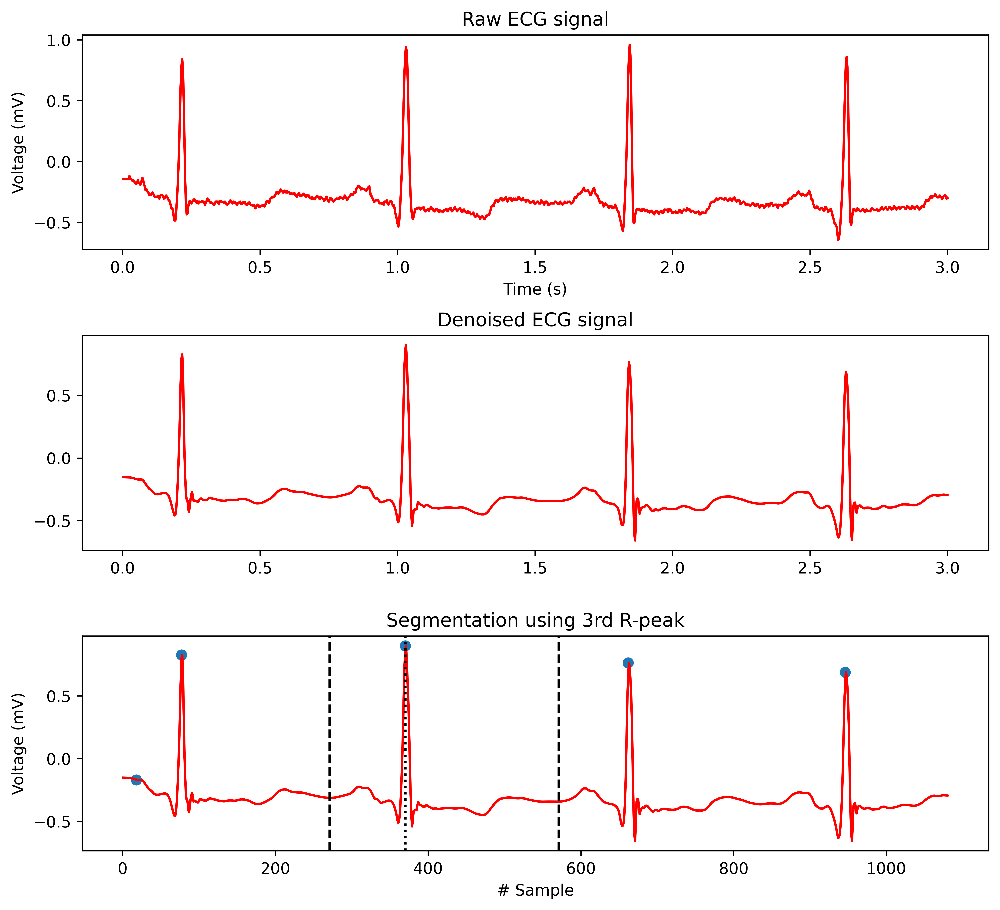

In [48]:
# Plot together raw, denoised and segmted signal
fig = plt.figure(figsize=(10,9), dpi=600)
x = np.arange(1, 1081)

# Raw signal plotting
plt.subplot(3, 1, 1)
plt.plot(x/360, data_mit[0:1080], color='red')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (mV)')
plt.title('Raw ECG signal')

# Denoised signal plotting
plt.subplot(3, 1, 2)
plt.plot(x/360, rdata_mit[0:1080], color='red')
plt.title('Denoised ECG signal')

# Segmentation visualization using two border lines
plt.subplot(3, 1, 3)
n_peak =5
r_peak_x = []
r_peak_y = []
for i in range(0, n_peak):
  r_peak_x.append(Rlocation_mit[i])
  r_peak_y.append(rdata_mit[Rlocation_mit[i]])
x = np.arange(1, 1081)
plt.plot(x, rdata_mit[0: 1080], color='red')
plt.scatter(r_peak_x, r_peak_y)
# line plotting
plt.axvline(x = Rlocation_mit[2], color = 'k', linestyle = ':') # 3rd r-peak
plt.axvline(x = Rlocation_mit[2]-99, color = 'k', linestyle = '--') 
plt.axvline(x = Rlocation_mit[2]+201, color = 'k', linestyle = '--') 

plt.xlabel('# Sample')
plt.ylabel('Voltage (mV)')
plt.title('Segmentation using 3rd R-peak')

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)



In [49]:
r_peak_xx_incart = Rlocation_incart[0], Rlocation_incart[1], Rlocation_incart[2], Rlocation_incart[3]
r_peak_yy_incart = rdata_incart[Rlocation_incart[0]], rdata_incart[Rlocation_incart[1]], rdata_incart[Rlocation_incart[2]], rdata_incart[Rlocation_incart[3]]

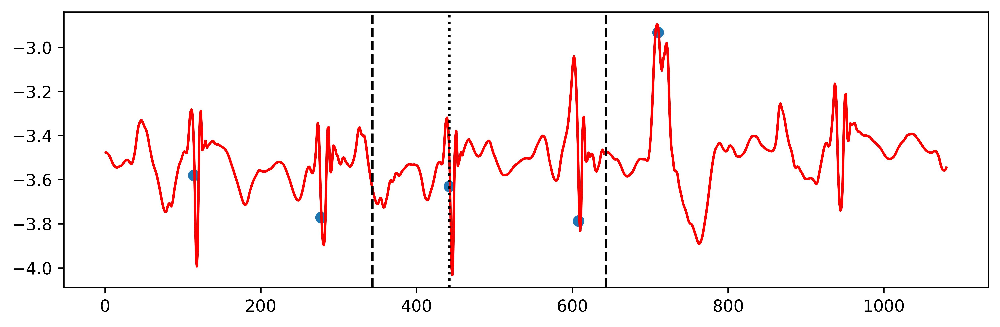

In [50]:
# Plotting R-peaks and segmentation lines
fig = plt.figure(figsize=(10,3), dpi=600)
n_peak =5
r_peak_x = []
r_peak_y = []
for i in range(0, n_peak):
  r_peak_x.append(Rlocation_incart[i])
  r_peak_y.append(rdata_incart[Rlocation_incart[i]])
x = np.arange(1, 1081)
plt.plot(x, rdata_incart[0: 1080], color='red')
plt.scatter(r_peak_x, r_peak_y)

# line plotting
plt.axvline(x = Rlocation_incart[2], color = 'k', linestyle = ':') 
plt.axvline(x = Rlocation_incart[2]-99, color = 'k', linestyle = '--') 
plt.axvline(x = Rlocation_incart[2]+201, color = 'k', linestyle = '--') 

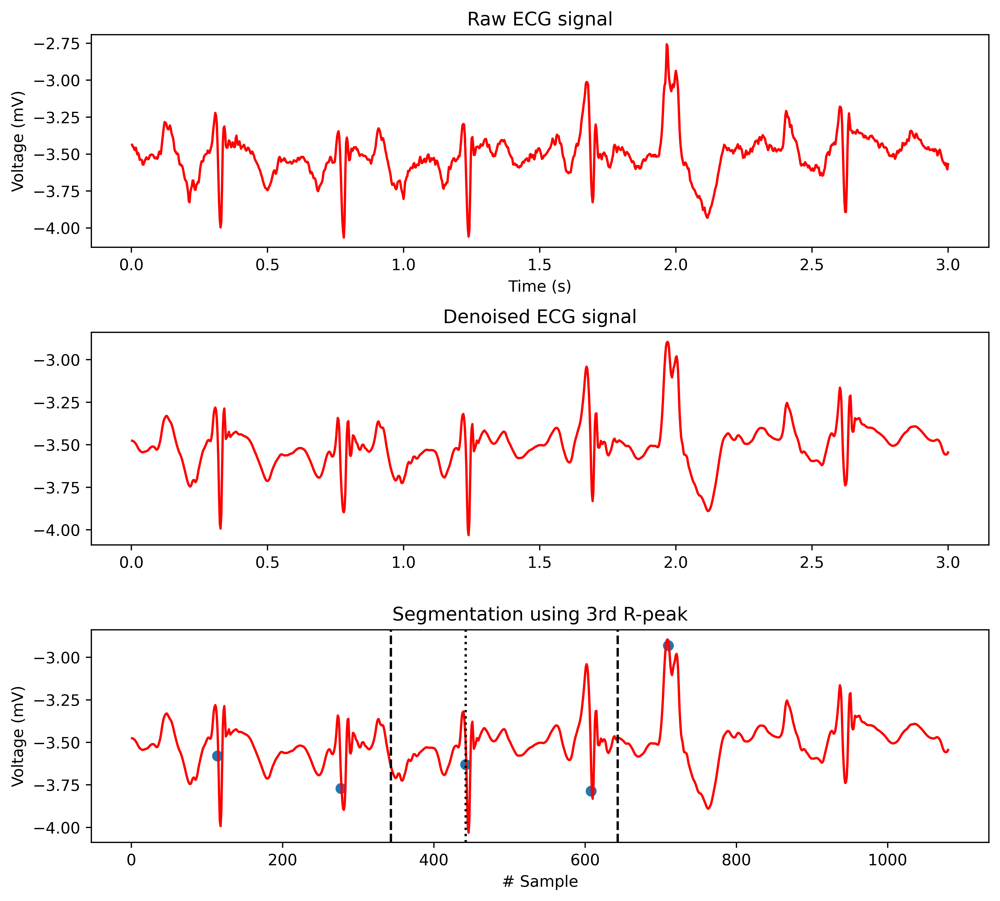

In [51]:
# Plot together raw, denoised and segmted signal
fig = plt.figure(figsize=(10,9), dpi=600)
x = np.arange(1, 1081)

# Raw signal plotting
plt.subplot(3, 1, 1)
plt.plot(x/360, data_incart[0:1080], color='red')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (mV)')
plt.title('Raw ECG signal')

# Denoised signal plotting
plt.subplot(3, 1, 2)
plt.plot(x/360, rdata_incart[0:1080], color='red')
plt.title('Denoised ECG signal')

# Segmentation visualization using two border lines
plt.subplot(3, 1, 3)
n_peak =5
r_peak_x = []
r_peak_y = []
for i in range(0, n_peak):
  r_peak_x.append(Rlocation_incart[i])
  r_peak_y.append(rdata_incart[Rlocation_incart[i]])
x = np.arange(1, 1081)
plt.plot(x, rdata_incart[0: 1080], color='red')
plt.scatter(r_peak_x, r_peak_y)
# line plotting
plt.axvline(x = Rlocation_incart[2], color = 'k', linestyle = ':') # 3rd r-peak
plt.axvline(x = Rlocation_incart[2]-99, color = 'k', linestyle = '--') 
plt.axvline(x = Rlocation_incart[2]+201, color = 'k', linestyle = '--') 

plt.xlabel('# Sample')
plt.ylabel('Voltage (mV)')
plt.title('Segmentation using 3rd R-peak')

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)



In [52]:
r_peak_xx_incart_resampled = Rlocation_incart_resampled[0], Rlocation_incart_resampled[1], Rlocation_incart_resampled[2], Rlocation_incart_resampled[3]
r_peak_yy_incart_resampled = rdata_incart_resampled[Rlocation_incart_resampled[0]], rdata_incart_resampled[Rlocation_incart_resampled[1]], rdata_incart_resampled[Rlocation_incart_resampled[2]], rdata_incart_resampled[Rlocation_incart_resampled[3]]

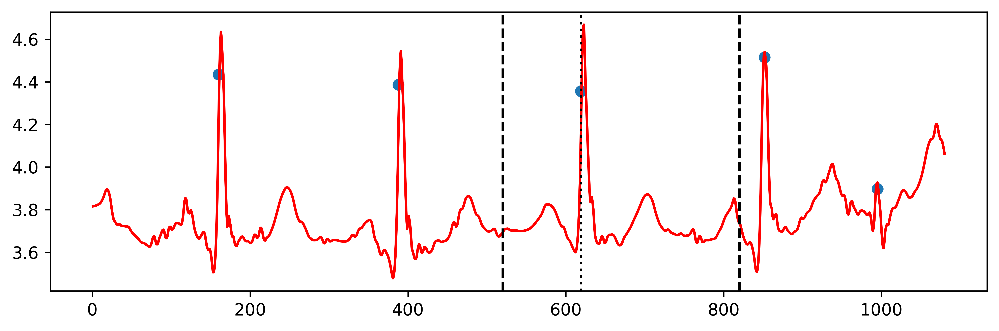

In [53]:
# Plotting R-peaks and segmentation lines
fig = plt.figure(figsize=(10,3), dpi=600)
n_peak =5
r_peak_x = []
r_peak_y = []
for i in range(0, n_peak):
  r_peak_x.append(Rlocation_incart_resampled[i])
  r_peak_y.append(rdata_incart_resampled[Rlocation_incart_resampled[i]])
x = np.arange(1, 1081)
plt.plot(x, rdata_incart_resampled[0: 1080], color='red')
plt.scatter(r_peak_x, r_peak_y)

# line plotting
plt.axvline(x = Rlocation_incart_resampled[2], color = 'k', linestyle = ':') 
plt.axvline(x = Rlocation_incart_resampled[2]-99, color = 'k', linestyle = '--') 
plt.axvline(x = Rlocation_incart_resampled[2]+201, color = 'k', linestyle = '--') 

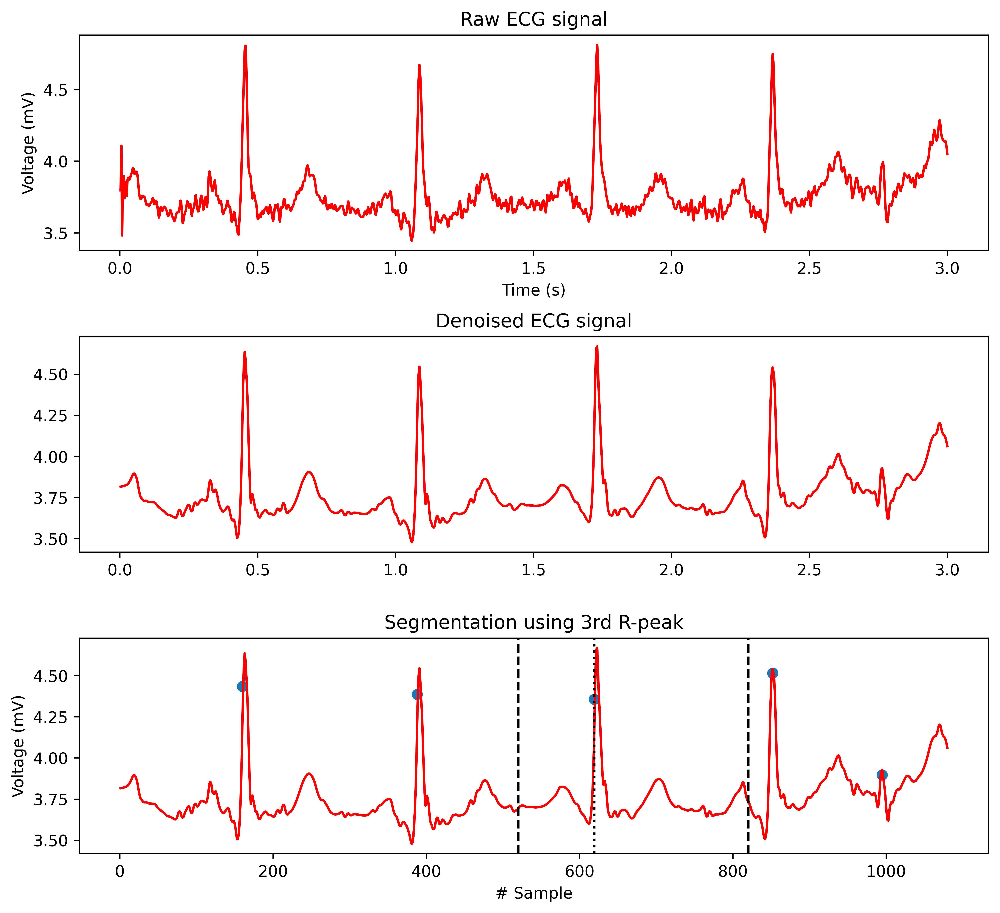

In [54]:
# Plot together raw, denoised and segmted signal
fig = plt.figure(figsize=(10,9), dpi=600)
x = np.arange(1, 1081)

# Raw signal plotting
plt.subplot(3, 1, 1)
plt.plot(x/360, data_incart_resampled[0:1080], color='red')
plt.xlabel('Time (s)')
plt.ylabel('Voltage (mV)')
plt.title('Raw ECG signal')

# Denoised signal plotting
plt.subplot(3, 1, 2)
plt.plot(x/360, rdata_incart_resampled[0:1080], color='red')
plt.title('Denoised ECG signal')

# Segmentation visualization using two border lines
plt.subplot(3, 1, 3)
n_peak =5
r_peak_x = []
r_peak_y = []
for i in range(0, n_peak):
  r_peak_x.append(Rlocation_incart_resampled[i])
  r_peak_y.append(rdata_incart_resampled[Rlocation_incart_resampled[i]])
x = np.arange(1, 1081)
plt.plot(x, rdata_incart_resampled[0: 1080], color='red')
plt.scatter(r_peak_x, r_peak_y)
# line plotting
plt.axvline(x = Rlocation_incart_resampled[2], color = 'k', linestyle = ':') # 3rd r-peak
plt.axvline(x = Rlocation_incart_resampled[2]-99, color = 'k', linestyle = '--') 
plt.axvline(x = Rlocation_incart_resampled[2]+201, color = 'k', linestyle = '--') 

plt.xlabel('# Sample')
plt.ylabel('Voltage (mV)')
plt.title('Segmentation using 3rd R-peak')

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)



In [55]:
from collections import Counter

all_classes = []

for pid in patient_ids_incart:
    ann = wfdb.rdann(project_path_incart + pid, 'atr')
    all_classes.extend(ann.symbol)

# Count frequencies
counter = Counter(all_classes)

print("Unique heartbeat types in INCART:", list(counter.keys()))
print("\nFrequencies:")
for cls, cnt in counter.items():
    print(f"{cls}: {cnt}")


Unique heartbeat types in INCART: ['N', 'V', 'A', 'F', 'Q', 'n', 'R', 'B', 'S', '+', 'j']

Frequencies:
N: 150410
V: 20013
A: 1944
F: 219
Q: 6
n: 32
R: 3174
B: 1
S: 16
+: 12
j: 92


# **Part C: Dataset Loading**

## **C1: Loading whole data**

In [56]:
# Read ECG signals and corresponding label
def getDataSet_mit(number, X_data, Y_data):
    
    # Considering 15 types ECG heartbeats that are later grouped in 5 classes
    ecgClassSet_mit = ['N', 'L', 'R', 'e', 'j', 'A', 'a', 'J', 'S', 'V', 'E', 'F', '/', 'f', 'Q'] 

    # Reading Channel names
    _, info_mit = wfdb.io.rdsamp(osj_mitdb(project_path_MIT, number))
    channels_mit = info_mit['sig_name']
    channel1_mit, channel2_mit = channels_mit[0], channels_mit[1]
    print(channel1_mit, channel2_mit)


    # Read ECG data records
    print("reading " + number+ " ECG data...")
    record_mit = wfdb.rdrecord(project_path_MIT + number, channel_names=[channel1_mit])
    data_mit = record_mit.p_signal.flatten()
    rdata_mit = denoise(data=data_mit)

    # Obtain the position and corresponding label of the R wave in the ECG data record
    annotation_mit = wfdb.rdann(project_path_MIT + number, 'atr')
    Rlocation_mit = annotation_mit.sample
    Rclass_mit = annotation_mit.symbol

    # Unstable data before and after removal
    start = 2  # if it creates problem then except will do the job
    end = 3  
    i = start
    j = len(annotation_mit.symbol) - end

    # Making labels, Y_data Convert NSVFQ in order to 0123456...14
    while i < j:
        try:
            beat_type_mit = Rclass_mit[i]
            lable_mit = ecgClassSet_mit.index(beat_type_mit)  # when beat is like '+' or other it will go on except loop
            x_train_mit = rdata_mit[Rlocation_mit[i] - 99:Rlocation_mit[i] + 201]
            X_data.append(x_train_mit)
            Y_data.append(lable_mit)
            i += 1
        except ValueError:
            # print(f' when i = {i}, beat type is out of our choise. For example +, [, ! or other')
            i += 1
    return X_data, Y_data

In [57]:
# Load the dataset and preprocess it
def loadData_mit():
    numberSet_mit = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
                 '111', '112', '113', '114', '115', '116', '117', '118', '119', '121', 
                 '122', '123', '124', '200', '201', '202', '203', '205', '207', '208', 
                 '209', '210', '212', '213', '214', '215', '217', '219', '220', '221', 
                 '222', '223', '228', '230', '231', '232', '233', '234'] # 48 readings
    dataSet_mit = []
    lableSet_mit = []
    for n in numberSet_mit:
        # getDataSet(n, dataSet, lableSet)
        dataSet_mit, lableSet_mit = getDataSet_mit(n, dataSet_mit, lableSet_mit)

    # Turn numpy array, scramble the order
    dataSet_mit = np.array(dataSet_mit).reshape(-1, 300)
    lableSet_mit = np.array(lableSet_mit).reshape(-1, 1)
    train_ds_mit = np.hstack((dataSet_mit, lableSet_mit))
    np.random.shuffle(train_ds_mit)

    # dataset and its label set
    X = train_ds_mit[:, :300]
    Y = train_ds_mit[:, 300]
    return X, Y

In [58]:
# Input X and Output Y data loading
X_mit, Y_mit = loadData_mit()

MLII V5
reading 100 ECG data...
MLII V1
reading 101 ECG data...
V5 V2
reading 102 ECG data...
MLII V2
reading 103 ECG data...
V5 V2
reading 104 ECG data...
MLII V1
reading 105 ECG data...
MLII V1
reading 106 ECG data...
MLII V1
reading 107 ECG data...
MLII V1
reading 108 ECG data...
MLII V1
reading 109 ECG data...
MLII V1
reading 111 ECG data...
MLII V1
reading 112 ECG data...
MLII V1
reading 113 ECG data...
V5 MLII
reading 114 ECG data...
MLII V1
reading 115 ECG data...
MLII V1
reading 116 ECG data...
MLII V2
reading 117 ECG data...
MLII V1
reading 118 ECG data...
MLII V1
reading 119 ECG data...
MLII V1
reading 121 ECG data...
MLII V1
reading 122 ECG data...
MLII V5
reading 123 ECG data...
MLII V4
reading 124 ECG data...
MLII V1
reading 200 ECG data...
MLII V1
reading 201 ECG data...
MLII V1
reading 202 ECG data...
MLII V1
reading 203 ECG data...
MLII V1
reading 205 ECG data...
MLII V1
reading 207 ECG data...
MLII V1
reading 208 ECG data...
MLII V1
reading 209 ECG data...
MLII V1
read

In [59]:
# Counting the number of each type of heartbeats

from collections import Counter

Y_list_mit = list(Y_mit)
Counter(Y_list_mit)

Counter({np.float64(0.0): 74920,
         np.float64(1.0): 8063,
         np.float64(2.0): 7244,
         np.float64(9.0): 7123,
         np.float64(12.0): 7012,
         np.float64(5.0): 2540,
         np.float64(13.0): 982,
         np.float64(11.0): 802,
         np.float64(4.0): 229,
         np.float64(6.0): 150,
         np.float64(10.0): 106,
         np.float64(7.0): 83,
         np.float64(14.0): 33,
         np.float64(3.0): 16,
         np.float64(8.0): 2})

In [60]:
# Read ECG signals and corresponding label
def getDataSet_incart(number, X_data, Y_data):
    
    # Considering 15 types ECG heartbeats that are later grouped in 5 classes
    ecgClassSet_incart = ['N', 'V', 'A', 'F', 'Q', 'n', 'R', 'B', 'S', '+', 'j'] 

    # Reading Channel names
    _, info_incart = wfdb.io.rdsamp(osj_mitdb(project_path_incart, number))
    channels_incart = info_incart['sig_name']
    channel1_incart, channel2_incart = channels_incart[0], channels_incart[1]
    print(channel1_incart, channel2_incart)


    # Read ECG data records
    print("reading " + number+ " ECG data...")
    record_incart = wfdb.rdrecord(project_path_incart + number, channel_names=[channel1_incart])
    data_incart = record_incart.p_signal.flatten()
    rdata_incart = denoise(data=data_incart)
    rdata_incart = resample_poly(rdata_incart, 257, 360)
    
    

    # Obtain the position and corresponding label of the R wave in the ECG data record
    annotation_incart = wfdb.rdann(project_path_incart + number, 'atr')
    Rlocation_incart = annotation_incart.sample
    Rclass_incart = annotation_incart.symbol

    # Rescale R-peak locations to match resampled (360 Hz) signal
    Rlocation_incart = np.round(Rlocation_incart * 360 / 257).astype(int)

    # Unstable data before and after removal
    start = 2  # if it creates problem then except will do the job
    end = 3  
    i = start
    j = len(annotation_incart.symbol) - end

    # Making labels, Y_data Convert NSVFQ in order to 0123456...14
    while i < j:
        try:
            beat_type_incart = Rclass_incart[i]
            lable_incart = ecgClassSet_incart.index(beat_type_incart)  # when beat is like '+' or other it will go on except loop
            x_train_incart = rdata_incart[Rlocation_incart[i] - 99:Rlocation_incart[i] + 201]
            if len(x_train_incart) == 300:
                X_data.append(x_train_incart)
                Y_data.append(lable_incart)
            i += 1
        except ValueError:
            # print(f' when i = {i}, beat type is out of our choise. For example +, [, ! or other')
            i += 1
    return X_data, Y_data

In [61]:
# Load the dataset and preprocess it
def loadData_incart():
    numberSet_incart = ['I01', 'I02', 'I03', 'I04', 'I05', 'I06', 'I07', 'I08', 'I09', 'I10',
                    'I11', 'I12', 'I13', 'I14', 'I15', 'I16', 'I17', 'I18', 'I19', 'I20',
                    'I21', 'I22', 'I23', 'I24', 'I25', 'I26', 'I27', 'I28', 'I29', 'I30',
                    'I31', 'I32', 'I33', 'I34', 'I35', 'I36', 'I37', 'I38', 'I39', 'I40',
                    'I41', 'I42', 'I43', 'I44', 'I45', 'I46', 'I47', 'I48', 'I49', 'I50',
                    'I51', 'I52', 'I53', 'I54', 'I55', 'I56', 'I57', 'I58', 'I59', 'I60',
                    'I61', 'I62', 'I63', 'I64', 'I65', 'I66', 'I67', 'I68', 'I69', 'I70',
                    'I71', 'I72', 'I73', 'I74', 'I75']

    dataSet_incart = []
    lableSet_incart = []
    for n in numberSet_incart:
        # getDataSet(n, dataSet, lableSet)
        dataSet_incart, lableSet_incart = getDataSet_incart(n, dataSet_incart, lableSet_incart)

    # Turn numpy array, scramble the order
    dataSet_incart = np.array(dataSet_incart).reshape(-1, 300)
    lableSet_incart = np.array(lableSet_incart).reshape(-1, 1)
    train_ds_incart = np.hstack((dataSet_incart, lableSet_incart))
    np.random.shuffle(train_ds_incart)

    # dataset and its label set
    X = train_ds_incart[:, :300]
    Y = train_ds_incart[:, 300]
    return X, Y

In [62]:
# Input X and Output Y data loading
X_incart, Y_incart = loadData_incart()

I II
reading I01 ECG data...
I II
reading I02 ECG data...
I II
reading I03 ECG data...
I II
reading I04 ECG data...
I II
reading I05 ECG data...
I II
reading I06 ECG data...
I II
reading I07 ECG data...
I II
reading I08 ECG data...
I II
reading I09 ECG data...
I II
reading I10 ECG data...
I II
reading I11 ECG data...
I II
reading I12 ECG data...
I II
reading I13 ECG data...
I II
reading I14 ECG data...
I II
reading I15 ECG data...
I II
reading I16 ECG data...
I II
reading I17 ECG data...
I II
reading I18 ECG data...
I II
reading I19 ECG data...
I II
reading I20 ECG data...
I II
reading I21 ECG data...
I II
reading I22 ECG data...
I II
reading I23 ECG data...
I II
reading I24 ECG data...
I II
reading I25 ECG data...
I II
reading I26 ECG data...
I II
reading I27 ECG data...
I II
reading I28 ECG data...
I II
reading I29 ECG data...
I II
reading I30 ECG data...
I II
reading I31 ECG data...
I II
reading I32 ECG data...
I II
reading I33 ECG data...
I II
reading I34 ECG data...
I II
reading I

In [63]:
# Counting the number of each type of heartbeats

from collections import Counter

Y_list_incart = list(Y_incart)
Counter(Y_list_incart)

Counter({np.float64(0.0): 76202,
         np.float64(1.0): 10439,
         np.float64(6.0): 1628,
         np.float64(2.0): 943,
         np.float64(3.0): 119,
         np.float64(10.0): 71,
         np.float64(5.0): 25,
         np.float64(8.0): 6,
         np.float64(4.0): 5,
         np.float64(9.0): 2})

In [64]:
from collections import Counter

all_classes = []

for pid in patient_ids_incart:
    ann = wfdb.rdann(project_path_incart + pid, 'atr')
    all_classes.extend(ann.symbol)

# Count frequencies
counter = Counter(all_classes)

print("Unique heartbeat types in INCART:", list(counter.keys()))
print("\nFrequencies:")
for cls, cnt in counter.items():
    print(f"{cls}: {cnt}")


Unique heartbeat types in INCART: ['N', 'V', 'A', 'F', 'Q', 'n', 'R', 'B', 'S', '+', 'j']

Frequencies:
N: 150410
V: 20013
A: 1944
F: 219
Q: 6
n: 32
R: 3174
B: 1
S: 16
+: 12
j: 92


## **C2: Ploting 15 Different Heartbeats**

In [65]:
# making pandas dataframe
df_X = pd.DataFrame(X)
df_Y = pd.DataFrame(Y)

NameError: name 'X' is not defined

In [ ]:
# changing the name from 0 to 300
df_Y.rename(columns = {0:300}, inplace = True)
# join X and Y
df = pd.concat([df_X, df_Y], axis=1)

In [ ]:
def Plot_Random_Beat(type, num):

  ecgClassSet = ['N', 'L', 'R', 'e', 'j', 'A', 'a', 'J', 'S', 'V', 'E', 'F', 'slash', 'f', 'Q']
  
  ecgClassName = ['Normal (N)', 'Left bundle br. bl. (L)', 'Right bundle br. bl. (R)', 
                  'Atrial escape (e)', 'Nodal jun. esc. (j)', 'Atrial premature (A)', 
                  'Aberrated atrial prem. (a)', 'Nodal jun. pre. (J)', 
                  'Supraventricular prem. (S)', 'Premature ventr. (V)', 
                  'Ventricular escape (E)', 'Fusion of ve. & no. (F)', 
                  'Paced (/)', 'Fusion of pa. & no. (f)', 
                  'Unclassifiable(Q)'] 

  # getting only a specific class ECG signal
  df_0 = df.loc[df[300]==type]  # For normanl class: 0, shape is 74920,301
  df_0 = df_0.drop(columns=[300]) # changing the shape to 74920,300

  # selecting some random row to plot
  if num<=df_0.shape[0]:
    np.random.seed(234)
    random_beat_number = np.random.randint(df_0.shape[0], size=(num))
    random_beat_number = list(random_beat_number)
  else: # Needed for Supraventricular Premature Beat (S) only, as it contains only 2 beats
    print(f"Warning: You have only {df_0.shape[0]} beat, but asked to plot {num}")
    random_beat_number = np.arange(0, df_0.shape[0])
    random_beat_number = list(random_beat_number)
  
  # ploting the ECG signal
  for i in random_beat_number:
    ecg_beat = df_0.iloc[i]
    plt.plot(ecg_beat)
  plt.title(str(ecgClassName[type]))

FileNotFoundError: [Errno 2] No such file or directory: '/content/gdrive/MyDrive/ECG Arrhythmia trying/Heartbeat_Figures/all_heartbeats.png'

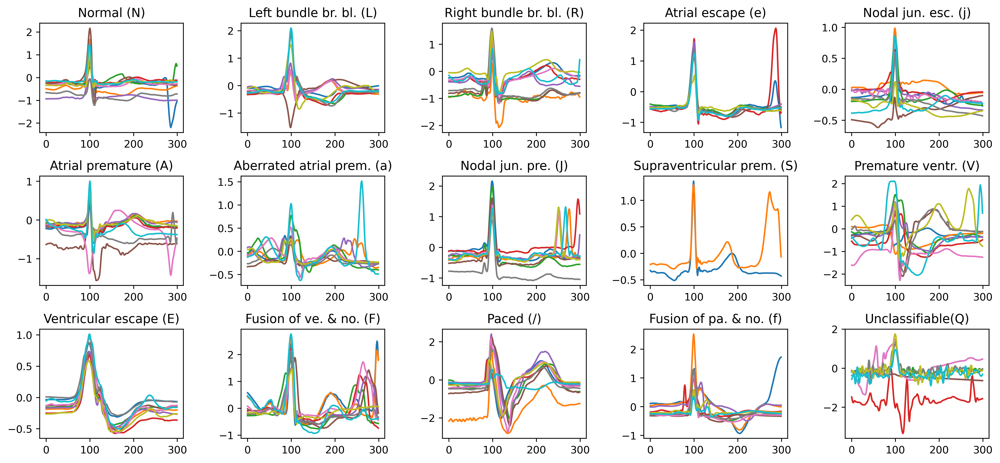

In [ ]:
# Plotting 15 different types of heartbeat
fig = plt.figure(figsize=(16,7), dpi=400)
fig.tight_layout(pad=15.0)
for i in range(15):
  plt.subplot(3,5,i+1)
  plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)
  Plot_Random_Beat(type=i, num=10)


# **Part D: Train-Test Splitting and Class Balancing**

## **D1: Data loading**
Data is already loaded, **this step can be skipped.** However, here the whole dataset is saved in a train_ds variable.

### **a. Load whole data**

In [66]:
# Load the dataset and preprocess it
def loadData_mit():
    numberSet = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
                 '111', '112', '113', '114', '115', '116', '117', '118', '119', '121', 
                 '122', '123', '124', '200', '201', '202', '203', '205', '207', '208', 
                 '209', '210', '212', '213', '214', '215', '217', '219', '220', '221', 
                 '222', '223', '228', '230', '231', '232', '233', '234']  # 48 readings
    dataSet = []
    lableSet = []
    for n in numberSet:
        # getDataSet(n, dataSet, lableSet)
        dataSet, lableSet = getDataSet_mit(n, dataSet, lableSet)

    # Turn numpy array, scramble the order
    dataSet = np.array(dataSet).reshape(-1, 300)
    lableSet = np.array(lableSet).reshape(-1, 1)
    train_ds = np.hstack((dataSet, lableSet))
    np.random.shuffle(train_ds)
    return train_ds

In [67]:
# Load the whole dataset (109305,301). Each row indicate an ECG beat time series data upto 300 
# and 301 colum is its label among 15 difference level
train_ds_mit = loadData_mit()

MLII V5
reading 100 ECG data...
MLII V1
reading 101 ECG data...
V5 V2
reading 102 ECG data...
MLII V2
reading 103 ECG data...
V5 V2
reading 104 ECG data...
MLII V1
reading 105 ECG data...
MLII V1
reading 106 ECG data...
MLII V1
reading 107 ECG data...
MLII V1
reading 108 ECG data...
MLII V1
reading 109 ECG data...
MLII V1
reading 111 ECG data...
MLII V1
reading 112 ECG data...
MLII V1
reading 113 ECG data...
V5 MLII
reading 114 ECG data...
MLII V1
reading 115 ECG data...
MLII V1
reading 116 ECG data...
MLII V2
reading 117 ECG data...
MLII V1
reading 118 ECG data...
MLII V1
reading 119 ECG data...
MLII V1
reading 121 ECG data...
MLII V1
reading 122 ECG data...
MLII V5
reading 123 ECG data...
MLII V4
reading 124 ECG data...
MLII V1
reading 200 ECG data...
MLII V1
reading 201 ECG data...
MLII V1
reading 202 ECG data...
MLII V1
reading 203 ECG data...
MLII V1
reading 205 ECG data...
MLII V1
reading 207 ECG data...
MLII V1
reading 208 ECG data...
MLII V1
reading 209 ECG data...
MLII V1
read

In [68]:
Y_mit = train_ds_mit[:, 300]

In [69]:
# Here 15 class of ECG data are saved 
Y_list_mit = list(Y_mit)
Counter(Y_list_mit)

Counter({np.float64(0.0): 74920,
         np.float64(1.0): 8063,
         np.float64(2.0): 7244,
         np.float64(9.0): 7123,
         np.float64(12.0): 7012,
         np.float64(5.0): 2540,
         np.float64(13.0): 982,
         np.float64(11.0): 802,
         np.float64(4.0): 229,
         np.float64(6.0): 150,
         np.float64(10.0): 106,
         np.float64(7.0): 83,
         np.float64(14.0): 33,
         np.float64(3.0): 16,
         np.float64(8.0): 2})

In [70]:
# Load the dataset and preprocess it
def loadData_incart():
    numberSet_incart = ['I01', 'I02', 'I03', 'I04', 'I05', 'I06', 'I07', 'I08', 'I09', 'I10',
                    'I11', 'I12', 'I13', 'I14', 'I15', 'I16', 'I17', 'I18', 'I19', 'I20',
                    'I21', 'I22', 'I23', 'I24', 'I25', 'I26', 'I27', 'I28', 'I29', 'I30',
                    'I31', 'I32', 'I33', 'I34', 'I35', 'I36', 'I37', 'I38', 'I39', 'I40',
                    'I41', 'I42', 'I43', 'I44', 'I45', 'I46', 'I47', 'I48', 'I49', 'I50',
                    'I51', 'I52', 'I53', 'I54', 'I55', 'I56', 'I57', 'I58', 'I59', 'I60',
                    'I61', 'I62', 'I63', 'I64', 'I65', 'I66', 'I67', 'I68', 'I69', 'I70',
                    'I71', 'I72', 'I73', 'I74', 'I75']

    dataSet_incart = []
    lableSet_incart = []
    for n in numberSet_incart:
        # getDataSet(n, dataSet, lableSet)
        dataSet_incart, lableSet_incart = getDataSet_incart(n, dataSet_incart, lableSet_incart)

    # Turn numpy array, scramble the order
    dataSet_incart = np.array(dataSet_incart).reshape(-1, 300)
    lableSet_incart = np.array(lableSet_incart).reshape(-1, 1)
    train_ds_incart = np.hstack((dataSet_incart, lableSet_incart))
    np.random.shuffle(train_ds_incart)

    # dataset and its label set
    X = train_ds_incart[:, :300]
    Y = train_ds_incart[:, 300]
    return dataSet_incart

In [71]:
train_ds_incart = loadData_incart()

I II
reading I01 ECG data...
I II
reading I02 ECG data...
I II
reading I03 ECG data...
I II
reading I04 ECG data...
I II
reading I05 ECG data...
I II
reading I06 ECG data...
I II
reading I07 ECG data...
I II
reading I08 ECG data...
I II
reading I09 ECG data...
I II
reading I10 ECG data...
I II
reading I11 ECG data...
I II
reading I12 ECG data...
I II
reading I13 ECG data...
I II
reading I14 ECG data...
I II
reading I15 ECG data...
I II
reading I16 ECG data...
I II
reading I17 ECG data...
I II
reading I18 ECG data...
I II
reading I19 ECG data...
I II
reading I20 ECG data...
I II
reading I21 ECG data...
I II
reading I22 ECG data...
I II
reading I23 ECG data...
I II
reading I24 ECG data...
I II
reading I25 ECG data...
I II
reading I26 ECG data...
I II
reading I27 ECG data...
I II
reading I28 ECG data...
I II
reading I29 ECG data...
I II
reading I30 ECG data...
I II
reading I31 ECG data...
I II
reading I32 ECG data...
I II
reading I33 ECG data...
I II
reading I34 ECG data...
I II
reading I

In [72]:
Y_list_incart = list(Y_incart)
Counter(Y_list_incart)

Counter({np.float64(0.0): 76202,
         np.float64(1.0): 10439,
         np.float64(6.0): 1628,
         np.float64(2.0): 943,
         np.float64(3.0): 119,
         np.float64(10.0): 71,
         np.float64(5.0): 25,
         np.float64(8.0): 6,
         np.float64(4.0): 5,
         np.float64(9.0): 2})

### **b. 15 types to 5 level conversion**

In [73]:
# 15 level to 5 level conversion
Y_5class = np.copy(Y_mit)

for i in range(Y_mit.shape[0]):
  # print(i)
  if 0 <= Y_mit[i] <= 4:
    Y_5class[i] = 0
  if 5 <= Y_mit[i] <= 8:
    Y_5class[i] = 1
  if 9 <= Y_mit[i] <= 10:
    Y_5class[i] = 2
  if Y_mit[i] == 11:
    Y_5class[i] = 3
  if 12 <= Y_mit[i] <= 14:
    Y_5class[i] = 4
print('changing done')

changing done


In [74]:
Y_5class_list = list(Y_5class)
Counter(Y_5class_list)

Counter({np.float64(0.0): 90472,
         np.float64(4.0): 8027,
         np.float64(2.0): 7229,
         np.float64(1.0): 2775,
         np.float64(3.0): 802})

In [75]:
ecg_dataset_mit = np.copy(train_ds_mit)

In [76]:
# label encode the target variable # just convert numpy.float64 to numpy.int64
from sklearn.preprocessing import LabelEncoder
Y_5class = LabelEncoder().fit_transform(Y_5class)

In [77]:
ecg_data_mit = ecg_dataset_mit[:, :300]
ecg_lable_mit = Y_5class.reshape(-1, 1) # otherwise np.hstack will not work 

In [78]:
# Complete ECG dataset with 5 type of Arrhythmia
ecg_dataset_5 = np.hstack((ecg_data_mit, ecg_lable_mit))

In [79]:
Y_3class = np.copy(Y_incart)

for i in range(Y_incart.shape[0]):
    if Y_incart[i] in [0, 5, 6]:       # 'N', 'n', 'R' → Normal
        Y_3class[i] = 0
    elif Y_incart[i] in [1, 3]:        # 'V', 'F' → Ventricular
        Y_3class[i] = 1
    else:                        # everything else → Supraventricular / other
        Y_3class[i] = 2

print('changing done')


changing done


In [80]:
Y_3class_list = list(Y_3class)
Counter(Y_3class_list)

Counter({np.float64(0.0): 77855,
         np.float64(1.0): 10558,
         np.float64(2.0): 1027})

In [81]:
ecg_dataset_incart = np.copy(train_ds_incart)

In [82]:
# label encode the target variable # just convert numpy.float64 to numpy.int64
from sklearn.preprocessing import LabelEncoder
Y_3class = LabelEncoder().fit_transform(Y_3class)

In [83]:
ecg_data_incart = ecg_dataset_incart[:, :300]
ecg_lable_incart = Y_3class.reshape(-1, 1) # otherwise np.hstack will not work 

In [84]:
# Complete ECG dataset with 5 type of Arrhythmia
ecg_dataset_3 = np.hstack((ecg_data_incart, ecg_lable_incart))

### **c. Per class data status checking (Full data)**

In [85]:
# Convert ndarray to dataframe
df_ecg_mit = pd.DataFrame(ecg_dataset_5)
class_data_mit = df_ecg_mit[300].value_counts()
class_data_mit

300
0.0    90472
4.0     8027
2.0     7229
1.0     2775
3.0      802
Name: count, dtype: int64

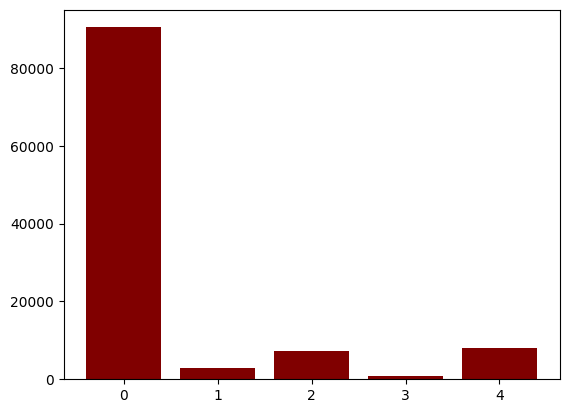

In [86]:
# per class data status plotting,
plt.bar(class_data_mit.index, class_data_mit.values, color ='maroon')
plt.show()

<Axes: xlabel='300'>

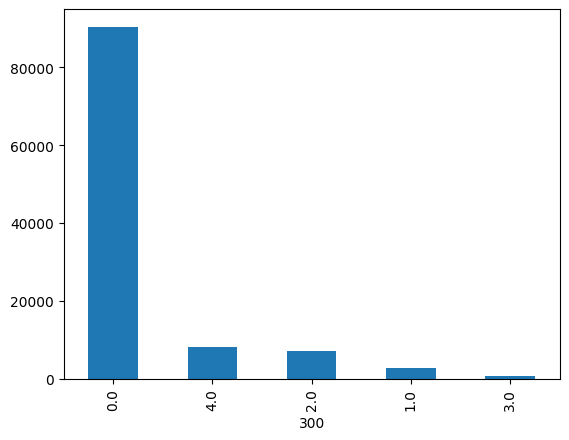

In [87]:
# shortcut for per class data status plotting,
# Order is not maintained by class. Higher to lower
df_ecg_mit[300].value_counts().plot(kind='bar')

In [88]:
# Convert ndarray to dataframe
df_ecg_incart = pd.DataFrame(ecg_dataset_3)
class_data_incart = df_ecg_incart[300].value_counts()
class_data_incart

300
0.0    77855
1.0    10558
2.0     1027
Name: count, dtype: int64

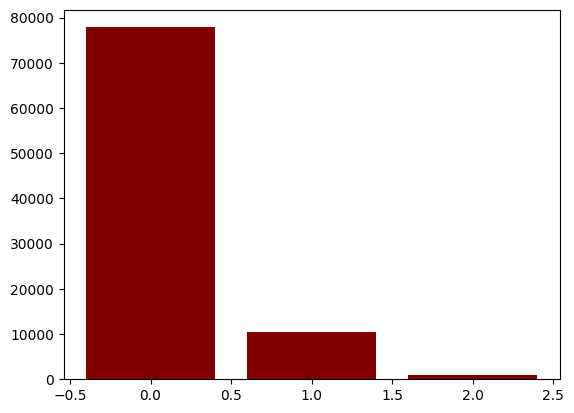

In [89]:
# per class data status plotting,
plt.bar(class_data_incart.index, class_data_incart.values, color ='maroon')
plt.show()

<Axes: xlabel='300'>

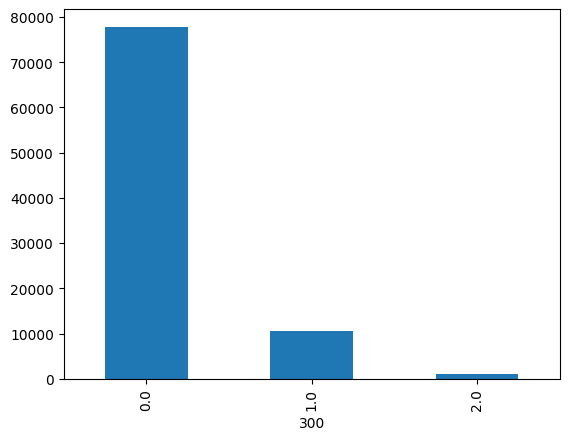

In [90]:
# shortcut for per class data status plotting,
# Order is not maintained by class. Higher to lower
df_ecg_incart[300].value_counts().plot(kind='bar')

## **D2: Train-Test Spliting**
**Note: Class Balance should be done on Training Data Only. Not Testing Data.**

In [93]:
# train test splitting
from sklearn.model_selection import train_test_split
ecg_data_mit = ecg_dataset_5[:, :300]
ecg_label_mit = ecg_dataset_5[:, 300]
x_train_mit, x_test_mit, y_train_mit, y_test_mit = train_test_split(ecg_data_mit, ecg_label_mit,
                                   random_state=104, 
                                   test_size=0.20, 
                                   shuffle=True)

In [94]:
# reshaping for using hstack function
y_train_mit = y_train_mit.reshape(-1, 1)
y_test_mit = y_test_mit.reshape(-1, 1)
train_data_mit = np.hstack((x_train_mit, y_train_mit))
test_data_mit = np.hstack((x_test_mit, y_test_mit))

In [95]:
#  converting dataframe
train_data_mit = pd.DataFrame(train_data_mit)
test_data_mit = pd.DataFrame(test_data_mit)

In [96]:
# saving the test data (in imbalanced condition)
file_name_mit = project_path_MIT + 'test_data_mit.pkl'
test_data_mit.to_pickle(file_name_mit)

**Training dataset status checking:** balanced / imbalanced

300
0.0    72348
4.0     6409
2.0     5782
1.0     2251
3.0      654
Name: count, dtype: int64


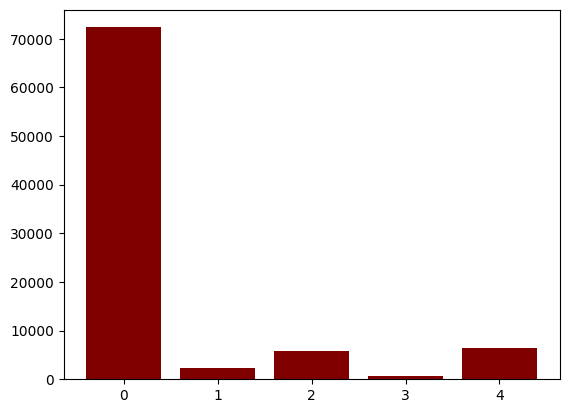

In [97]:
# Imblanced training data graph ploting 
class_data_mit = train_data_mit[300].value_counts()
print(class_data_mit)
plt.bar(class_data_mit.index, class_data_mit.values, color ='maroon')
plt.show()

## **D3: Class balancing by undersampling and SMOTE** 
**SMOTE** stands for '**Synthetic Minority Oversampling Technique**'.
Plan for train data
1. Class 1: Randomly selected 50000 data
2. Class 1, 2, 3, 4: Use SMOTE to oversample upto 50000 data

In [ ]:
# extracting class 0 and 4 others class
train_data_0 = train_data.loc[(train_data[300] == 0)]
train_data_1234 = train_data.loc[(train_data[300] != 0)]

In [ ]:
# 1. Class 1: Randomly selected 50000 data
from sklearn.utils import resample
train_data_0_resampled=train_data_0.sample(n=50000,random_state=42)

# convert dataframe to numpy array
train_data_0_resampled = train_data_0_resampled.to_numpy()

In [ ]:
# 2. Class 1, 2, 3, 4: Use SMOTE to oversample upto 50000 data

# converting from df to np ndarray
train_data_1234_arr = train_data_1234.to_numpy()
X_4cl, y_4cl = train_data_1234_arr[:, :-1], train_data_1234_arr[:, -1]

from imblearn.over_sampling import SMOTE
# transform the dataset
strategy = {1:50000, 2:50000, 3:50000, 4:50000}
oversample = SMOTE(sampling_strategy=strategy)
X, y = oversample.fit_resample(X_4cl, y_4cl)

y = y.reshape(-1, 1)
train_data_1234_resampled = np.hstack((X, y))

In [ ]:
# Join the class 0 and 1234
train_data_resampled = np.vstack((train_data_0_resampled, train_data_1234_resampled))

# shuffle the data, needed for proper training
np.take(train_data_resampled,np.random.permutation(train_data_resampled.shape[0]),axis=0,out=train_data_resampled)

array([[-0.28722445, -0.28848494, -0.28968116, ..., -0.2676001 ,
        -0.27120236,  0.        ],
       [-0.30751179, -0.3057489 , -0.30397116, ...,  0.75158413,
         0.82591842,  0.        ],
       [-0.16800687, -0.17244045, -0.17732933, ..., -0.28988055,
        -0.28821461,  1.        ],
       ...,
       [-0.07768788, -0.0759095 , -0.07457754, ..., -0.13804258,
        -0.13573806,  0.        ],
       [-0.65170895, -0.66662218, -0.68198135, ..., -0.11181153,
        -0.0988044 ,  2.        ],
       [ 0.0824179 ,  0.05861659,  0.0314233 , ...,  1.74909868,
         1.61083942,  2.        ]])

300
0.0    50000
1.0    50000
2.0    50000
3.0    50000
4.0    50000
Name: count, dtype: int64


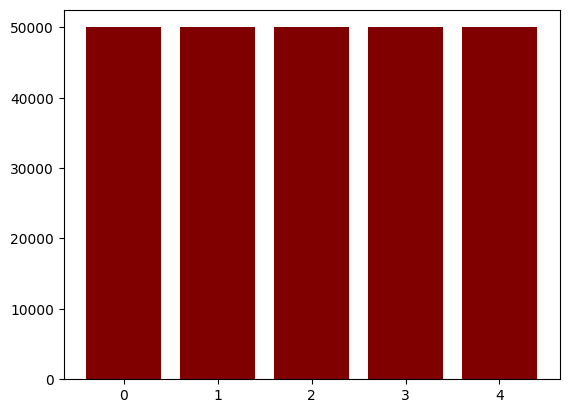

In [ ]:
# blanced training data graph ploting 
train_data_r = pd.DataFrame(train_data_resampled)
class_data = train_data_r[300].value_counts()
print(class_data)
plt.bar(class_data.index, class_data.values, color ='maroon')
plt.show()

# save balanced training data
file_name = project_path_MIT + 'train_data_SMOTE.pkl'
train_data_r.to_pickle(file_name)

In [ ]:
data_bal = np.array(class_data)
data_bal2 = data_bal.reshape(1, 5)

FileNotFoundError: [Errno 2] No such file or directory: '/content/gdrive/MyDrive/ECG Arrhythmia trying/Heartbeat_Figures/Class balancing.png'

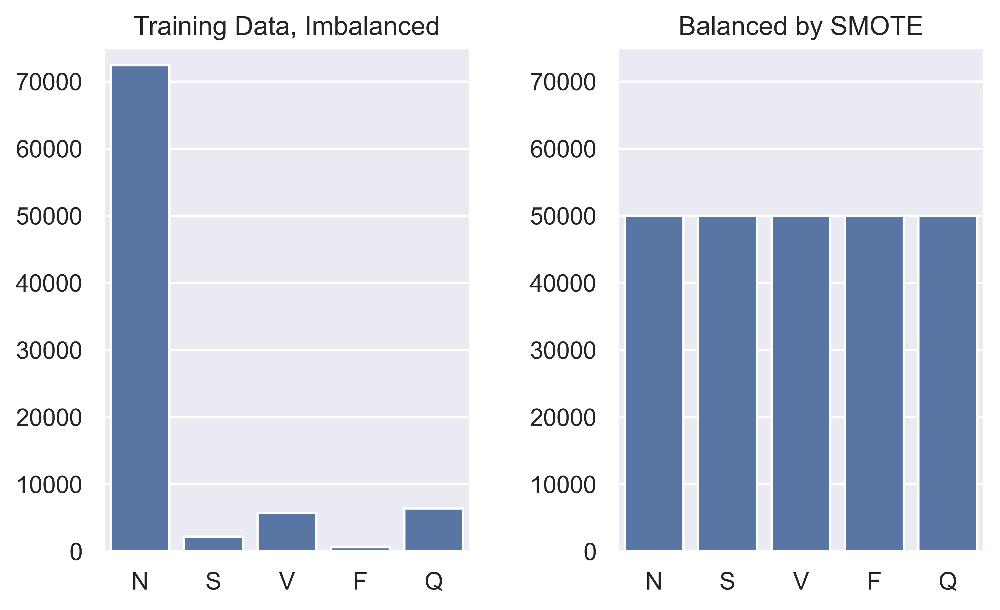

In [ ]:
# a single plot which gives proper illustration before and after class balancing
import seaborn as sns
sns.set()
sns.color_palette("hls", 8)

fig = plt.figure(figsize=(7,4), dpi=600)
plt.subplot(121)
sns.barplot(x = ['N', 'S', 'V', 'F', 'Q'], y = [72420, 2212, 5774, 637, 6401])
plt.ylim(0, 75000)
plt.title('Training Data, Imbalanced')

plt.subplot(122)
sns.barplot(x = ['N', 'S', 'V', 'F', 'Q'], y = class_data.values)
plt.ylim(0, 75000)
plt.title('Balanced by SMOTE')

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.5)

figure_path = '/content/gdrive/MyDrive/ECG Arrhythmia trying/Heartbeat_Figures/'
fig.savefig(figure_path+ 'Class balancing.png')

# **Part E: Model Building and Training**
A **CNN-LSTM and attention** based hybrid model is formulated. 

## **E1: Attention Mechanism**
**Convolutional Block Attention Module** ([CBAM](https://arxiv.org/abs/1807.06521)) consists two parts (i) **channel attention**, (ii) spatial attention. ECG is an 1D signal and 1-lead ECG is used in the modle.Therefore, only channel attention is only used.

In [202]:
# udf for channel attention mechanism
class ChannelAttention(tf.keras.layers.Layer):
      def __init__(self, filters, ratio):
        super(ChannelAttention, self).__init__()
        self.filters = filters
        self.ratio = ratio

      def build(self, input_shape):
          self.shared_layer_one = tf.keras.layers.Dense(self.filters//self.ratio,
                            activation='relu', kernel_initializer='he_normal',
                            use_bias=True,
                            bias_initializer='zeros')
          self.shared_layer_two = tf.keras.layers.Dense(self.filters,
                            kernel_initializer='he_normal',
                            use_bias=True,
                            bias_initializer='zeros')

      def call(self, inputs):
          # AvgPool
          avg_pool = tf.keras.layers.GlobalAveragePooling1D()(inputs)


          avg_pool = self.shared_layer_one(avg_pool)
          avg_pool = self.shared_layer_two(avg_pool)

          # MaxPool
          max_pool = tf.keras.layers.GlobalMaxPooling1D()(inputs)
          

          max_pool = self.shared_layer_one(max_pool)
          max_pool = self.shared_layer_two(max_pool)


          attention = tf.keras.layers.Add()([avg_pool,max_pool])
          attention = tf.keras.layers.Activation('sigmoid')(attention)
          attention = tf.expand_dims(attention, axis=1)  # (batch, 1, filters)

    




          return tf.keras.layers.Multiply()([inputs, attention])
    

# udf for spatial attention mechanism
class SpatialAttention(tf.keras.layers.Layer):
      def __init__(self, kernel_size):
        super(SpatialAttention, self).__init__()
        self.kernel_size = kernel_size

      def build(self, input_shape):
          self.conv2d = tf.keras.layers.Conv2D(filters = 1,
                  kernel_size=self.kernel_size,
                  strides=1,
                  padding='same',
                  activation='sigmoid',
                  kernel_initializer='he_normal',
                  use_bias=False)

      def call(self, inputs):

          # AvgPool
          avg_pool = tf.keras.layers.Lambda(lambda x: tf.keras.backend.mean(x, axis=3, keepdims=True))(inputs)

          # MaxPool
          max_pool = tf.keras.layers.Lambda(lambda x: tf.keras.backend.max(x, axis=3, keepdims=True))(inputs)

          attention = tf.keras.layers.Concatenate(axis=3)([avg_pool, max_pool])

          attention = self.conv2d(attention)


          return tf.keras.layers.multiply([inputs, attention])
    

In [182]:
#E2: Making Transformer Encoder

#Transformer is designe followed by the encoder given in Attention is all you need paper. Here, input is ECG signal after some convolution layers.

import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Dropout, MultiHeadAttention, LayerNormalization, BatchNormalization, GlobalAveragePooling1D, Dense, Add, Flatten
from tensorflow.keras.models import Model
import numpy as np

In [183]:
class TransformerEncoder(tf.keras.layers.Layer):
    def __init__(self, num_heads, d_model, dff, dropout_rate):
        super(TransformerEncoder, self).__init__()

        self.multi_head_attention = tf.keras.layers.MultiHeadAttention(key_dim=d_model, num_heads=num_heads)
        self.dropout = tf.keras.layers.Dropout(dropout_rate)
        self.layer_norm = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.dense = tf.keras.layers.Dense(dff, activation='relu')

    def call(self, inputs, training=True):
        attention_output = self.multi_head_attention(inputs, inputs)
        attention_output = self.dropout(attention_output, training=training)
        attention_output = self.layer_norm(inputs + attention_output)

        ffn_output = self.dense(attention_output)
        ffn_output = self.dropout(ffn_output, training=training)
        encoder_output = self.layer_norm(attention_output + ffn_output)

        return encoder_output

In [184]:
def positional_encoding(seq_len, d, n=10000):
    P = np.zeros((seq_len, d))
    for k in range(seq_len):
        for i in np.arange(int(d/2)):
            denominator = np.power(n, 2*i/d)
            P[k, 2*i] = np.sin(k/denominator)
            P[k, 2*i+1] = np.cos(k/denominator)
    return tf.constant(P, dtype=tf.float32)

## **E2: CNN-LSTM and attention model architecture**

### **a. Model building**

In [185]:
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Reshape

In [203]:
def build_model(max_sequence_length, num_channels, d_model, num_heads, dff, dropout_rate):
  # Input layer for the time series data
    input_sequence = Input(shape=(max_sequence_length, num_channels))

    # Convolutional layers
    
    x = Conv1D(filters=16, kernel_size=21, strides=1, padding='same', activation='relu')(input_sequence)
    print(x.shape)
    x = BatchNormalization()(x)
    print(x.shape)
    x = ChannelAttention(16, 8)(x)
    print(x.shape)
    x = MaxPooling1D(pool_size=(3), strides=2, padding='same')(x)

    x = Conv1D(filters=32, kernel_size=23, strides=1, padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = ChannelAttention(32, 8)(x) 
    x = MaxPooling1D(pool_size=(3), strides=2, padding='same')(x)

    x = Conv1D(filters=64, kernel_size=25, strides=1, padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = ChannelAttention(64, 8)(x)
  

    x = MaxPooling1D(pool_size=(3), strides=2, padding='same')(x)

    x = Conv1D(filters=128, kernel_size=27, strides=1, padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = ChannelAttention(128, 8)(x)
    


    def positional_encoding(seq_len, d, n=10000):
      P = np.zeros((seq_len, d))
      for k in range(seq_len):
        for i in np.arange(int(d/2)):
            denominator = np.power(n, 2*i/d)
            P[k, 2*i] = np.sin(k/denominator)
            P[k, 2*i+1] = np.cos(k/denominator)
        return tf.constant(P, dtype=tf.float32)


    # Positional Encoding
    positional_encoding = positional_encoding(seq_len = 38, d=128)
    x = x + positional_encoding


    # Transformer Encoder block
    query = x  # 'query' branch is the output from the last Conv1D layer
    value = x  # 'value' branch is also the output from the last Conv1D layer

    # Create TransformerEncoder class instance
    transformer_encoder = TransformerEncoder(num_heads=num_heads, d_model=d_model, dff=dff, dropout_rate=dropout_rate)
    encoder_output = transformer_encoder(query)  # Call the TransformerEncoder instance with 'query' input

    x = Flatten()(encoder_output)
    x = Dense(units=128, activation='relu')(x)
    x = Dropout(rate=0.2)(x)


    # Output layer
    output = Dense(units=5, activation='softmax')(x)

    # Create the model
    model = Model(inputs=input_sequence, outputs=output)

    return model

### **b. Hyperparameter Tuning**
Many architectures of model is found by changing hyperparameters.
* Model: with or without channel or spatial attention.
* CNN Filters: Number of filters in each Conv layer is changing like 4, 16, 32, 64, 128 etc.
* LSTM Units: Number of units of two LSTM layer is varing like 32, 64, 128 etc.

In [204]:
# Hyperparameters
max_sequence_length = 300
num_channels = 1  # For single-channel ECG, set num_channels to 1. For multi-channel, adjust accordingly.
d_model = 128
num_heads = 4
dropout_rate = 0.2
dff = 128

# Build the model using the user-defined function
model = build_model(max_sequence_length, num_channels, d_model, num_heads, dff, dropout_rate)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
     

(None, 300, 16)
(None, 300, 16)
(None, 300, 16)


In [205]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_28 (InputLayer)     │ (None, 300, 1)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_29 (Conv1D)              │ (None, 300, 16)        │           352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 300, 16)        │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ channel_attention_27            │ (None, 300, 16)        │            82 │
│ (ChannelAttention)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_18 (MaxPooling1D) │ (None, 150, 16)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_30 (Conv1D)              │ (None, 150, 32)        │        11,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_29          │ (None, 150, 32)        │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ channel_attention_28            │ (None, 150, 32)        │           292 │
│ (ChannelAttention)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_19 (MaxPooling1D) │ (None, 75, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_31 (Conv1D)              │ (None, 75, 64)         │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 75, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ channel_attention_29            │ (None, 75, 64)         │         1,096 │
│ (ChannelAttention)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_20 (MaxPooling1D) │ (None, 38, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_32 (Conv1D)              │ (None, 38, 128)        │       221,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 38, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ channel_attention_30            │ (None, 38, 128)        │         4,240 │
│ (ChannelAttention)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ add_26 (Add)                    │ (None, 38, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_encoder             │ (None, 38, 128)        │       280,576 │
│ (TransformerEncoder)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4864)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 128)            │       622,720 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,195,347 (4.56 MB)

 Trainable params: 1,194,867 (4.56 MB)

 Non-trainable params: 480 (1.88 KB)

### **c. Model Training**

**Build, save and then Fit the Model.**
If we have already the saved model, then no need to build, save and fit again.

In [207]:
#Define the log directory, which must be a subdirectory of the specified
#directory when starting the web application. It is recommended to use date and time as the subdirectory name
logdir = project_path_MIT + "logs\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
model_path = project_path_MIT + "trans1_incart_tomek_25_v2"
model_path3 = model_path + "m3"

In [208]:
import json

# Define the path to the JSON file in your Google Drive
logdir_filepath = project_path_MIT + "logdir_entries.json"

# Load existing entries from JSON file (if any)
try:
    with open(logdir_filepath, "r") as file:
        entries = json.load(file)
except FileNotFoundError:
    entries = {}

# Add the logdir entry with a unique identifier
entry_id = len(entries) + 1
entries[entry_id] = logdir

# Save the updated entries to the JSON file
with open(logdir_filepath, "w") as file:
    json.dump(entries, file, indent=4)

print("Logdir entry saved with ID:", entry_id)

Logdir entry saved with ID: 1


In [209]:
ratio = 0.15
     

In [211]:

if os.path.exists(model_path):
  # Import the trained model
  print('Model is already have in the filepath')
  model = tf.keras.models.load_model(filepath=model_path)
else:
  # Build a CNN model
  print('Model not found, now building and then saving')

  # Define the TensorBoard object
  tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=1)
  # early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='auto', patience=3)
  checkpoint_filepath = project_path_MIT + "trans1_incart_tomek_25_v2.weights.h5"
  model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath,
                                                                 save_weights_only=True, monitor='val_accuracy',
                                                                 mode='max', save_best_only=True)
  callback_list = [tensorboard_callback, model_checkpoint_callback]
  # Training and Validation
  history = model.fit(x_train_mit, y_train_mit, epochs=50,
            batch_size=128,
            validation_split=ratio,
            callbacks=callback_list)
  model.save(filepath=model_path)

Model not found, now building and then saving
Epoch 1/50
140/581 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - accuracy: 0.8806 - loss: 0.4685

KeyboardInterrupt: 

### **d. Plotting Accuracy and Loss**
Training and Validation accuray and loss curve plotting.

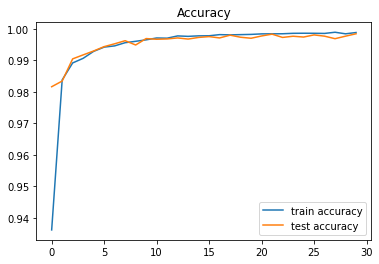

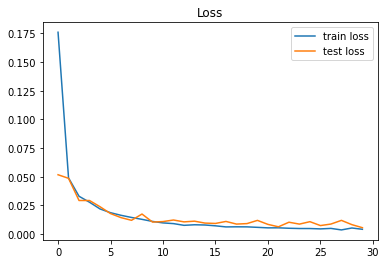

In [ ]:
# plot accuracy during training
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='test accuracy') # label is actually 'validation accuracy'
plt.legend()
plt.show()

# plot loss during training
plt.title('Loss')
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='test loss') # label is actually 'validation accuracy'
plt.legend()
plt.show()

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%tensorboard --logdir '/content/gdrive/MyDrive/ECG Arrhythmia trying/mit-bih-arrhythmia-database-1.0.0/logs\20221220-113542'

<IPython.core.display.Javascript object>

# **Part F: Results**


## **F1: Classification Accuracy and Confusion Matrix**
The overall classification accuracy and confusion matrix generated by the follwoing code.

**Model Testing**
* a. Using **recently trained** and Saved Model after 30 Epochs.
* b. Using the **best model** saved by *'model checkpoint'* callback.

**a. Using Recently Trained Model**

In [ ]:
# evaluate the model
train_loss, train_acc = model.evaluate(X_train, Y_train, verbose=0)
test_loss, test_acc = model.evaluate(X_test, Y_test, verbose=0)
print('Training Accuracy: %.2f, Test Accuracy: %.2f' % (train_acc*100, test_acc*100))
print('Training Loss: %.2f, Test Loss: %.2f' % (train_loss*100, test_loss*100))

Training Accuracy: 99.93, Test Accuracy: 99.12
Training Loss: 0.23, Test Loss: 5.95


**b. Using the Best Model**
We saved many checkpoints of the model. Among these checkpoints we will consider the checkpoint which has the largest validation accuracy. Then copy its path and update the model weights. 

In [ ]:
# model2 taken fro model_checkpoint callback
model2 = buildModel()
model2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Update the weights with best validation accuracy # Loads the weights
model2.load_weights(checkpoint_filepath)

In [ ]:
# evaluate the best model
train_loss_cp, train_acc_cp = model2.evaluate(X_train, Y_train, verbose=0)
test_loss_cp, test_acc_cp = model2.evaluate(X_test, Y_test, verbose=0)
print('Training Accuracy: %.2f, Test Accuracy: %.2f' % (train_acc_cp*100, test_acc_cp*100))
print('Training Loss: %.2f, Test Loss: %.2f' % (train_loss_cp*100, test_loss_cp*100))

Training Accuracy: 99.93, Test Accuracy: 99.12
Training Loss: 0.23, Test Loss: 5.95


**Confusion Matrix**

In [ ]:
# confusion matrix
def plotHeatMap(Y_test, Y_pred):
    con_mat = confusion_matrix(Y_test, Y_pred)
    # Normalized
    # con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]
    # con_mat_norm = np.around(con_mat_norm, decimals=2)

    # Plotting
    plt.figure(figsize=(8, 8))
    seaborn.heatmap(con_mat, annot=True, square=True, fmt='.20g', cmap='Greens')
    plt.ylim(0, 5)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.show()

684/684 [==============================] - 4s 4ms/step


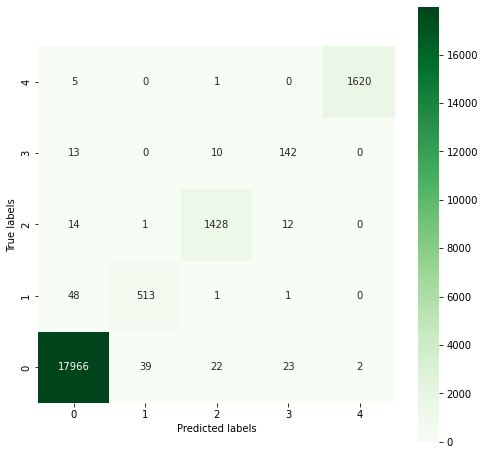

In [ ]:
# predict
Y_pred = np.argmax(model.predict(X_test), axis=-1)
# Y_pred = model.predict_classes(X_test)
# plot confusion matrix
plotHeatMap(Y_test, Y_pred)

## **F2: Per Class Performance**
Calculating per class Sensitivity, Specificity, Accuracy and F1 score. 

In [ ]:
# Per class accuracy printing function
def _report(TN, FP, FN, TP):
    TPR = TP/(TP+FN) if (TP+FN)!=0 else 0
    TNR = TN/(TN+FP) if (TN+FP)!=0 else 0
    PPV = TP/(TP+FP) if (TP+FP)!=0 else 0
    '''
    report = {'TP': TP, 'TN': TN, 'FP': FP, 'FN': FN, 
              'TPR': TPR, 'Recall': TPR, 'Sensitivity': TPR,
              'TNR' : TNR, 'Specificity': TNR,
              'FPR': FP/(FP+TN) if (FP+TN)!=0 else 0,
              'FNR': FN/(FN+TP) if (FN+TP)!=0 else 0,
              'PPV': PPV, 'Precision': PPV,
              'F1 Score': 2*(PPV*TPR)/(PPV+TPR),
              'Per Class Accuracy': (TP+TN)/(TP+FP+FN+TN)
             }'''

    report = {'Sensitivity (%)': TPR*100,
              'Specificity (%)': TNR*100,
              'F1 Score (%)': 2*100*(PPV*TPR)/(PPV+TPR),
              'Per Class Accuracy (%)': (TP+TN)*100/(TP+FP+FN+TN)
             }
    return report

def multi_classification_report(y_test, y_pred, labels=None, encoded_labels=True, as_frame=False):
    """
    Args:
        y_test (ndarray)
        y_pred (ndarray)
        labels (list)
        encoded_labels (bool): Need to be False if labels are not one hot encoded
        as_fram (bool): If True, return type will be DataFrame
        
    Return:
        report (dict)
    """
    
    import numpy as np
    import pandas as pd
    from sklearn.metrics import multilabel_confusion_matrix
    
    conf_labels = None if encoded_labels else labels
    
    conf_mat = multilabel_confusion_matrix(y_test, y_pred, labels=conf_labels)
    report = dict()
    if labels == None:
        counter = np.arange(len(conf_mat))
    else:
        counter = labels
        
    for i, name in enumerate(counter):
        TN, FP, FN, TP = conf_mat[i].ravel()
        report[name] = _report(TN, FP, FN, TP)
    
    if as_frame:
        return pd.DataFrame(report)
    return report

**a. Recently Trained Model**

In [ ]:
# Per class performance
labels = ['N', 'S', 'V', 'F', 'Q']
Y_pred = np.argmax(model.predict(X_test), axis=-1)
multi_classification_report(Y_test, Y_pred, labels=labels, encoded_labels=True, as_frame=True)

684/684 [==============================] - 3s 4ms/step


,N,S,V,F,Q
Sensitivity (%),99.523598,91.119005,98.144330,86.060606,99.630996
Specificity (%),97.899711,99.812189,99.833382,99.834071,99.990116
F1 Score (%),99.540141,91.935484,97.908810,82.798834,99.753695
Per Class Accuracy (%),99.240657,99.588308,99.720964,99.730113,99.963405


**b. Best Model**

In [ ]:
# Per class performance
labels = ['N', 'S', 'V', 'F', 'Q']
Y_pred = np.argmax(model2.predict(X_test), axis=-1)
multi_classification_report(Y_test, Y_pred, labels=labels, encoded_labels=True, as_frame=True)

684/684 [==============================] - 4s 5ms/step


,N,S,V,F,Q
Sensitivity (%),99.523598,91.119005,98.144330,86.060606,99.630996
Specificity (%),97.899711,99.812189,99.833382,99.834071,99.990116
F1 Score (%),99.540141,91.935484,97.908810,82.798834,99.753695
Per Class Accuracy (%),99.240657,99.588308,99.720964,99.730113,99.963405
